**Table of contents**<a id='toc0_'></a>    
- [Imports](#toc1_)    
- [Read Datasets](#toc2_)    
- [Experiments](#toc3_)    
  - [m = 1.3](#toc3_1_)    
    - [Dataset 0](#toc3_1_1_)    
    - [Dataset 1](#toc3_1_2_)    
    - [Dataset 2](#toc3_1_3_)    
  - [m = 1.4](#toc3_2_)    
    - [Dataset 0](#toc3_2_1_)    
    - [Dataset 1](#toc3_2_2_)    
    - [Dataset 2](#toc3_2_3_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

# <a id='toc1_'></a>[Imports](#toc0_)

In [15]:
from kfcm_k_w1 import KFCM_K_W1
import numpy as np
from sklearn import datasets
import pandas as pd
import sklearn
import seaborn as sns

----

# <a id='toc2_'></a>[Read Datasets](#toc0_)

In [2]:
paths = ["../Dataset/mfeat-fac", "../Dataset/mfeat-fou", "../Dataset/mfeat-zer"]

dfs = [pd.read_csv(path, delim_whitespace=True, header=None) for path in paths]

In [3]:
Xs = []
ys = []
for df in dfs:
    # Label creation
    df["digit"] = [i for i in range(10) for __ in range(200)]
    Xs.append(df.drop("digit", axis=1).values)
    ys.append(df["digit"].values)

# <a id='toc3_'></a>[Experiments](#toc0_)

## <a id='toc3_1_'></a>[m = 1.3](#toc0_)

### <a id='toc3_1_1_'></a>[Dataset 0](#toc0_)

In [4]:
n_clusters = 10
m = 1.3
max_iter = 100
tol = 1e-6
random_state = 42

n_runs = 50

model_arrays = []
metrics_3 = []
best_loss = np.inf
best_index = None
for i in range(n_runs):
    print("="*50)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    kfcm.fit(Xs[0], ys[0])
    metrics_3.append(kfcm.evaluate())
    model_arrays.append({
        "U": kfcm._U,
        "G": kfcm._G,
        "s": kfcm._s,
    })
    if metrics_3[i]["loss"] < best_loss:
        best_loss = metrics_3[i]["loss"]
        best_index = i

-> Run 1/50
Iteration 1: J = 34.81375903641496
(2000,) (2000,)
{'accuracy': 0.483, 'MPC': 0.016072835146309417, 'rand': 0.31156174607073617, 'loss': 34.81375903641496}
Iteration 2: J = 34.59487697313402
(2000,) (2000,)
{'accuracy': 0.464, 'MPC': 0.07671002122656945, 'rand': 0.3010380557971557, 'loss': 34.59487697313402}
Iteration 3: J = 33.18817287563946
(2000,) (2000,)
{'accuracy': 0.519, 'MPC': 0.16973803654864472, 'rand': 0.35195245217665433, 'loss': 33.18817287563946}
Iteration 4: J = 32.36367224119997
(2000,) (2000,)
{'accuracy': 0.538, 'MPC': 0.21306777807882105, 'rand': 0.38837554378249767, 'loss': 32.36367224119997}
Iteration 5: J = 31.811032454981508
(2000,) (2000,)
{'accuracy': 0.5405, 'MPC': 0.2413892176687713, 'rand': 0.39966374549767175, 'loss': 31.811032454981508}
Iteration 6: J = 31.435801317933876
(2000,) (2000,)
{'accuracy': 0.564, 'MPC': 0.2654911593216529, 'rand': 0.416387223430718, 'loss': 31.435801317933876}
Iteration 7: J = 31.086975230296083
(2000,) (2000,)
{'acc

In [7]:
best_index, metrics_3[best_index]

(45,
 {'accuracy': 0.742,
  'MPC': 0.581502477470659,
  'rand': 0.5777970889753978,
  'loss': 28.600691612365623})

In [10]:
# Metrics for m = 1.3
acc_vec3 = [metrics_3[i]["accuracy"] for i in range(n_runs)]
rand_vec3 = [metrics_3[i]["rand"] for i in range(n_runs)]
mpc_vec3 = [metrics_3[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec3):.4f}" + u" \u00b1 " + f"{np.std(acc_vec3):.4f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec3):.4f}" + u" \u00b1 " + f"{np.std(rand_vec3):.4f}")
print(f"Mean MPC: {np.mean(mpc_vec3):.4f}" + u" \u00b1 " + f"{np.std(mpc_vec3):.4f}")

Mean Accuracy: 0.7964 ± 0.0423
Mean Adjusted Rand Score: 0.6351 ± 0.0435
Mean MPC: 0.5821 ± 0.0024


In [11]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
best_u3 = np.array(model_arrays[best_index]["U"])
u3_crisp = np.zeros_like(best_u3)
for k in range(best_u3.shape[0]):
    max_index = np.argmax(best_u3[k])
    u3_crisp[k][max_index] = 1

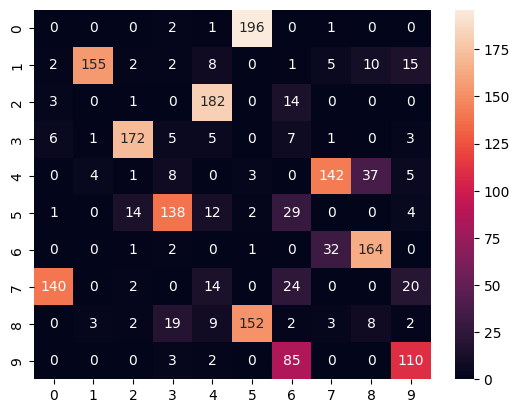

In [20]:
# Confusion matrix for m = 1.3
num_groups = u3_crisp.shape[1]
clusters3 = np.zeros((num_groups, num_groups))
rows = u3_crisp.shape[0] // num_groups
for h in range(num_groups):
    clusters3[h] = np.sum(u3_crisp[h*rows:(h+1)*rows], axis=0)
clusters3 = pd.DataFrame(clusters3.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters3, annot=True, fmt="d")

In [21]:
clusters3

,0,1,2,3,4,5,6,7,8,9
0,0,0,0,2,1,196,0,1,0,0
1,2,155,2,2,8,0,1,5,10,15
2,3,0,1,0,182,0,14,0,0,0
3,6,1,172,5,5,0,7,1,0,3
4,0,4,1,8,0,3,0,142,37,5
5,1,0,14,138,12,2,29,0,0,4
6,0,0,1,2,0,1,0,32,164,0
7,140,0,2,0,14,0,24,0,0,20
8,0,3,2,19,9,152,2,3,8,2
9,0,0,0,3,2,0,85,0,0,110


### <a id='toc3_1_2_'></a>[Dataset 1](#toc0_)

In [22]:
n_clusters = 10
m = 1.3
max_iter = 100
tol = 1e-6
random_state = 42

n_runs = 50

model_arrays_1 = []
metrics_3_1 = []
best_loss = np.inf
best_index_1 = None
for i in range(n_runs):
    print("="*50)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_1 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    # Dataset 1
    kfcm_1.fit(Xs[1], ys[1])
    metrics_3_1.append(kfcm_1.evaluate())
    model_arrays_1.append({
        "U": kfcm_1._U,
        "G": kfcm_1._G,
        "s": kfcm_1._s,
    })
    if metrics_3_1[i]["loss"] < best_loss:
        best_loss = metrics_3_1[i]["loss"]
        best_index_1 = i

-> Run 1/50
Iteration 1: J = 29.030325473659776
(2000,) (2000,)
{'accuracy': 0.463, 'MPC': 0.04516977532355859, 'rand': 0.32871638767740924, 'loss': 29.030325473659776}
Iteration 2: J = 28.934152747208056
(2000,) (2000,)
{'accuracy': 0.441, 'MPC': 0.07643412438147645, 'rand': 0.30958011007749253, 'loss': 28.934152747208056}
Iteration 3: J = 28.931905417074802
(2000,) (2000,)
{'accuracy': 0.4085, 'MPC': 0.0861925357816744, 'rand': 0.27716971148967945, 'loss': 28.931905417074802}
Iteration 4: J = 28.94661388963755
(2000,) (2000,)
{'accuracy': 0.3865, 'MPC': 0.08729980652141245, 'rand': 0.26696054930678964, 'loss': 28.94661388963755}
Iteration 5: J = 28.948421840229546
(2000,) (2000,)
{'accuracy': 0.3775, 'MPC': 0.08697456565409722, 'rand': 0.266481986280059, 'loss': 28.948421840229546}
Iteration 6: J = 28.948219785112876
(2000,) (2000,)
{'accuracy': 0.3715, 'MPC': 0.08654291304716766, 'rand': 0.26102000561271654, 'loss': 28.948219785112876}
Iteration 7: J = 28.94768808663092
(2000,) (200

In [65]:
best_index_1, metrics_3_1[best_index_1]

(7,
 {'accuracy': 0.351,
  'MPC': 0.13138623843437203,
  'rand': 0.18670423324677435,
  'loss': 28.667034631423583})

In [24]:
# Metrics for m = 1.3
acc_vec3_1 = [metrics_3_1[i]["accuracy"] for i in range(n_runs)]
rand_vec3_1 = [metrics_3_1[i]["rand"] for i in range(n_runs)]
mpc_vec3_1 = [metrics_3_1[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec3_1):.4f}" + u" \u00b1 " + f"{np.std(acc_vec3_1):.4f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec3_1):.4f}" + u" \u00b1 " + f"{np.std(rand_vec3_1):.4f}")
print(f"Mean MPC: {np.mean(mpc_vec3_1):.4f}" + u" \u00b1 " + f"{np.std(mpc_vec3_1):.4f}")

Mean Accuracy: 0.3502 ± 0.0066
Mean Adjusted Rand Score: 0.1871 ± 0.0034
Mean MPC: 0.1305 ± 0.0065


In [66]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
best_u3_1 = np.array(model_arrays_1[best_index_1]["U"])
u3_crisp_1 = np.zeros_like(best_u3_1)
for k in range(best_u3_1.shape[0]):
    max_index = np.argmax(best_u3_1[k])
    u3_crisp_1[k][max_index] = 1

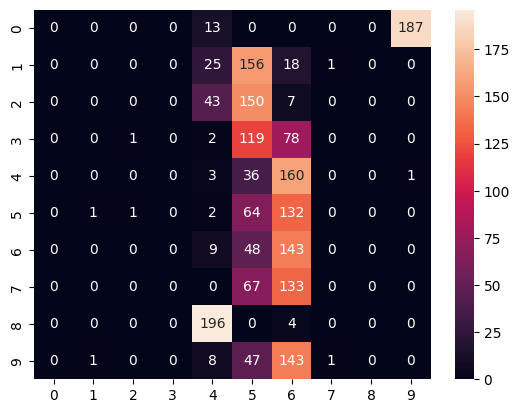

In [67]:
# Confusion matrix for m = 1.3
num_groups = u3_crisp_1.shape[1]
clusters3_1 = np.zeros((num_groups, num_groups))
rows = u3_crisp_1.shape[0] // num_groups
for h in range(num_groups):
    clusters3_1[h] = np.sum(u3_crisp_1[h*rows:(h+1)*rows], axis=0)
clusters3_1 = pd.DataFrame(clusters3_1.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters3_1, annot=True, fmt="d")

In [32]:
clusters3_1

,0,1,2,3,4,5,6,7,8,9
0,0,0,13,0,0,187,0,0,0,0
1,0,0,25,156,0,0,0,0,19,0
2,0,0,43,150,0,0,0,0,7,0
3,0,0,2,120,0,0,0,0,78,0
4,0,0,3,36,0,1,0,0,160,0
5,0,2,2,64,0,0,0,0,132,0
6,0,0,9,48,0,0,0,0,143,0
7,0,0,0,67,0,0,0,0,133,0
8,0,0,196,0,0,0,0,0,4,0
9,0,1,8,47,0,0,0,0,144,0


### <a id='toc3_1_3_'></a>[Dataset 2](#toc0_)

In [33]:
n_clusters = 10
m = 1.3
max_iter = 100
tol = 1e-6
random_state = 42

n_runs = 50

model_arrays_2 = []
metrics_3_2 = []
best_loss = np.inf
best_index_2 = None
for i in range(n_runs):
    print("="*50)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_2 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    # Dataset 2
    kfcm_2.fit(Xs[2], ys[2])
    metrics_3_2.append(kfcm_2.evaluate())
    model_arrays_2.append({
        "U": kfcm_2._U,
        "G": kfcm_2._G,
        "s": kfcm_2._s,
    })
    if metrics_3_2[i]["loss"] < best_loss:
        best_loss = metrics_3_2[i]["loss"]
        best_index_2 = i

-> Run 1/50
Iteration 1: J = 28.248243292472562
(2000,) (2000,)
{'accuracy': 0.4965, 'MPC': 0.1784283568931443, 'rand': 0.3019673223739163, 'loss': 28.248243292472562}
Iteration 2: J = 28.14488575961084
(2000,) (2000,)
{'accuracy': 0.524, 'MPC': 0.21659830097955113, 'rand': 0.3280751447398482, 'loss': 28.14488575961084}
Iteration 3: J = 27.695075946482774
(2000,) (2000,)
{'accuracy': 0.543, 'MPC': 0.2568114982409355, 'rand': 0.3559213568947159, 'loss': 27.695075946482774}
Iteration 4: J = 27.04275552182012
(2000,) (2000,)
{'accuracy': 0.563, 'MPC': 0.30961294876205114, 'rand': 0.3833931507632194, 'loss': 27.04275552182012}
Iteration 5: J = 26.349377808654715
(2000,) (2000,)
{'accuracy': 0.5725, 'MPC': 0.35600970566334766, 'rand': 0.39567769048522344, 'loss': 26.349377808654715}
Iteration 6: J = 25.98426956985917
(2000,) (2000,)
{'accuracy': 0.5875, 'MPC': 0.37591995821319835, 'rand': 0.40816489750025553, 'loss': 25.98426956985917}
Iteration 7: J = 25.840073265818944
(2000,) (2000,)
{'a

In [64]:
best_index_2, metrics_3_2[best_index_2]

(43,
 {'accuracy': 0.601,
  'MPC': 0.47276314338832626,
  'rand': 0.42703397247148683,
  'loss': 25.488372727371125})

In [35]:
# Metrics for m = 1.3
acc_vec3_2 = [metrics_3_2[i]["accuracy"] for i in range(n_runs)]
rand_vec3_2 = [metrics_3_2[i]["rand"] for i in range(n_runs)]
mpc_vec3_2 = [metrics_3_2[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec3_2):.4f}" + u" \u00b1 " + f"{np.std(acc_vec3_2):.4f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec3_2):.4f}" + u" \u00b1 " + f"{np.std(rand_vec3_2):.4f}")
print(f"Mean MPC: {np.mean(mpc_vec3_2):.4f}" + u" \u00b1 " + f"{np.std(mpc_vec3_2):.4f}")

Mean Accuracy: 0.6043 ± 0.0150
Mean Adjusted Rand Score: 0.4314 ± 0.0114
Mean MPC: 0.4737 ± 0.0102


In [36]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
best_u3_2 = np.array(model_arrays_2[best_index_2]["U"])
u3_crisp_2 = np.zeros_like(best_u3_2)
for k in range(best_u3_2.shape[0]):
    max_index = np.argmax(best_u3_2[k])
    u3_crisp_2[k][max_index] = 1

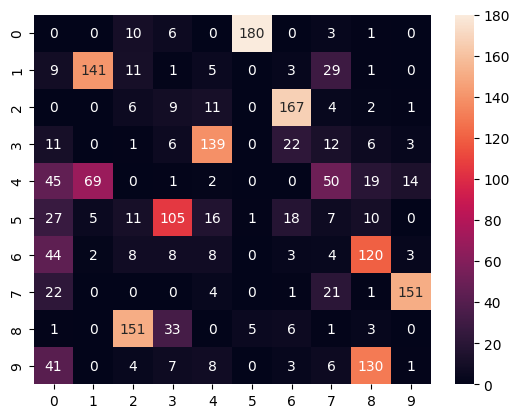

In [37]:
# Confusion matrix for m = 1.3
num_groups = u3_crisp_2.shape[1]
clusters3_2 = np.zeros((num_groups, num_groups))
rows = u3_crisp_2.shape[0] // num_groups
for h in range(num_groups):
    clusters3_2[h] = np.sum(u3_crisp_2[h*rows:(h+1)*rows], axis=0)
clusters3_2 = pd.DataFrame(clusters3_2.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters3_2, annot=True, fmt="d")

In [38]:
clusters3_2

,0,1,2,3,4,5,6,7,8,9
0,0,0,10,6,0,180,0,3,1,0
1,9,141,11,1,5,0,3,29,1,0
2,0,0,6,9,11,0,167,4,2,1
3,11,0,1,6,139,0,22,12,6,3
4,45,69,0,1,2,0,0,50,19,14
5,27,5,11,105,16,1,18,7,10,0
6,44,2,8,8,8,0,3,4,120,3
7,22,0,0,0,4,0,1,21,1,151
8,1,0,151,33,0,5,6,1,3,0
9,41,0,4,7,8,0,3,6,130,1


## <a id='toc3_2_'></a>[m = 1.4](#toc0_)

### <a id='toc3_2_1_'></a>[Dataset 0](#toc0_)

In [75]:
n_clusters = 10
m = 1.4
max_iter = 100
tol = 1e-6
n_runs = 50

model_arrays = []
metrics_4 = []
best_loss = np.inf
best_index_4 = None
for i in range(n_runs):
    print("="*50)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_4 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    kfcm_4.fit(Xs[0], ys[0])
    metrics_4.append(kfcm_4.evaluate())
    model_arrays.append({
        "U": kfcm_4._U,
        "G": kfcm_4._G,
        "s": kfcm_4._s,
    })
    if metrics_4[i]["loss"] < best_loss:
        best_loss = metrics_4[i]["loss"]
        best_index_4 = i

-> Run 1/50
Iteration 1: J = 27.211006600557354
(2000,) (2000,)
{'accuracy': 0.511, 'MPC': 0.002083026039278124, 'rand': 0.3074173086411803, 'loss': 27.211006600557354}
Iteration 2: J = 28.38696907004993
(2000,) (2000,)
{'accuracy': 0.4065, 'MPC': 0.00511222433803904, 'rand': 0.23025913418297342, 'loss': 28.38696907004993}
Iteration 3: J = 28.230971305020475
(2000,) (2000,)
{'accuracy': 0.3855, 'MPC': 0.015281412800123961, 'rand': 0.2356909440556661, 'loss': 28.230971305020475}
Iteration 4: J = 27.912660114781005
(2000,) (2000,)
{'accuracy': 0.4115, 'MPC': 0.04256150542141768, 'rand': 0.26956118464067896, 'loss': 27.912660114781005}
Iteration 5: J = 27.52804014317787
(2000,) (2000,)
{'accuracy': 0.452, 'MPC': 0.07851222810887337, 'rand': 0.32552360277391623, 'loss': 27.52804014317787}
Iteration 6: J = 27.229846437781866
(2000,) (2000,)
{'accuracy': 0.471, 'MPC': 0.1011453875698407, 'rand': 0.35554401971542365, 'loss': 27.229846437781866}
Iteration 7: J = 26.99317610356103
(2000,) (2000

In [76]:
best_index_4, metrics_4[best_index_4]

(6,
 {'accuracy': 0.8375,
  'MPC': 0.4006906387605482,
  'rand': 0.6786858184526349,
  'loss': 25.29913388259225})

In [77]:
# Metrics for m = 1.3
acc_vec4 = [metrics_4[i]["accuracy"] for i in range(n_runs)]
rand_vec4 = [metrics_4[i]["rand"] for i in range(n_runs)]
mpc_vec4 = [metrics_4[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec4):.4f}" + u" \u00b1 " + f"{np.std(acc_vec4):.4f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec4):.4f}" + u" \u00b1 " + f"{np.std(rand_vec4):.4f}")
print(f"Mean MPC: {np.mean(mpc_vec4):.4f}" + u" \u00b1 " + f"{np.std(mpc_vec4):.4f}")

Mean Accuracy: 0.8356 ± 0.0132
Mean Adjusted Rand Score: 0.6766 ± 0.0148
Mean MPC: 0.4005 ± 0.0015


In [78]:
# Crisp partition of the best result for m = 1.3
#best_u4 = pd.DataFrame(u3[best_j3])
best_u4 = np.array(model_arrays[best_index_4]["U"])
u4_crisp = np.zeros_like(best_u4)
for k in range(best_u4.shape[0]):
    max_index = np.argmax(best_u4[k])
    u4_crisp[k][max_index] = 1

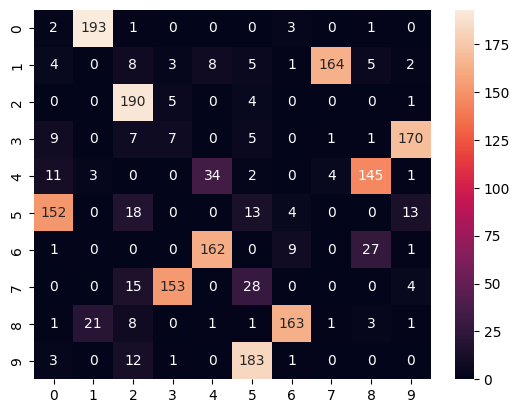

In [79]:
# Confusion matrix for m = 1.3
num_groups = u4_crisp.shape[1]
clusters4 = np.zeros((num_groups, num_groups))
rows = u4_crisp.shape[0] // num_groups
for h in range(num_groups):
    clusters4[h] = np.sum(u4_crisp[h*rows:(h+1)*rows], axis=0)
clusters4 = pd.DataFrame(clusters4.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters4, annot=True, fmt="d")

In [80]:
clusters4

,0,1,2,3,4,5,6,7,8,9
0,2,193,1,0,0,0,3,0,1,0
1,4,0,8,3,8,5,1,164,5,2
2,0,0,190,5,0,4,0,0,0,1
3,9,0,7,7,0,5,0,1,1,170
4,11,3,0,0,34,2,0,4,145,1
5,152,0,18,0,0,13,4,0,0,13
6,1,0,0,0,162,0,9,0,27,1
7,0,0,15,153,0,28,0,0,0,4
8,1,21,8,0,1,1,163,1,3,1
9,3,0,12,1,0,183,1,0,0,0


### <a id='toc3_2_2_'></a>[Dataset 1](#toc0_)

In [81]:
n_clusters = 10
m = 1.4
max_iter = 100
tol = 1e-6
random_state = 42

n_runs = 50

model_arrays_4_1 = []
metrics_4_1 = []
best_loss = np.inf
best_index_4_1 = None
for i in range(n_runs):
    print("="*50)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_4_1 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    # Dataset 1
    kfcm_4_1.fit(Xs[1], ys[1])
    metrics_4_1.append(kfcm_4_1.evaluate())
    model_arrays_4_1.append({
        "U": kfcm_4_1._U,
        "G": kfcm_4_1._G,
        "s": kfcm_4_1._s,
    })
    if metrics_4_1[i]["loss"] < best_loss:
        best_loss = metrics_4_1[i]["loss"]
        best_index_4_1 = i

-> Run 1/50
Iteration 1: J = 23.266005944808455
(2000,) (2000,)
{'accuracy': 0.458, 'MPC': 0.015846808456670414, 'rand': 0.32479821204040066, 'loss': 23.266005944808455}
Iteration 2: J = 23.354055842995336
(2000,) (2000,)
{'accuracy': 0.417, 'MPC': 0.027686957430843595, 'rand': 0.2918298281680328, 'loss': 23.354055842995336}
Iteration 3: J = 23.302817327806977
(2000,) (2000,)
{'accuracy': 0.386, 'MPC': 0.039923174144013585, 'rand': 0.26623869042646653, 'loss': 23.302817327806977}
Iteration 4: J = 23.302930012969945
(2000,) (2000,)
{'accuracy': 0.3715, 'MPC': 0.046388735273157455, 'rand': 0.2606086607115193, 'loss': 23.302930012969945}
Iteration 5: J = 23.30921899989538
(2000,) (2000,)
{'accuracy': 0.36, 'MPC': 0.04883130780281253, 'rand': 0.25034136575047466, 'loss': 23.30921899989538}
Iteration 6: J = 23.310994981217867
(2000,) (2000,)
{'accuracy': 0.3495, 'MPC': 0.049769387934801235, 'rand': 0.23658212082930966, 'loss': 23.310994981217867}
Iteration 7: J = 23.311138726057607
(2000,) 

In [82]:
best_index_4_1, metrics_4_1[best_index_4_1]

(23,
 {'accuracy': 0.346,
  'MPC': 0.08261788810706672,
  'rand': 0.18498195780636606,
  'loss': 23.281887669684693})

In [83]:
# Metrics for m = 1.3
acc_vec4_1 = [metrics_4_1[i]["accuracy"] for i in range(n_runs)]
rand_vec4_1 = [metrics_4_1[i]["rand"] for i in range(n_runs)]
mpc_vec4_1 = [metrics_4_1[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec4_1):.4f}" + u" \u00b1 " + f"{np.std(acc_vec4_1):.4f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec4_1):.4f}" + u" \u00b1 " + f"{np.std(rand_vec4_1):.4f}")
print(f"Mean MPC: {np.mean(mpc_vec4_1):.4f}" + u" \u00b1 " + f"{np.std(mpc_vec4_1):.4f}")

Mean Accuracy: 0.3210 ± 0.0319
Mean Adjusted Rand Score: 0.1837 ± 0.0017
Mean MPC: 0.0706 ± 0.0154


In [110]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
best_u4_1 = np.array(model_arrays_4_1[best_index_4_1]["U"])
u4_crisp_1 = np.zeros_like(best_u4_1)
for k in range(best_u4_1.shape[0]):
    max_index = np.argmax(best_u4_1[k])
    u4_crisp_1[k][max_index] = 1

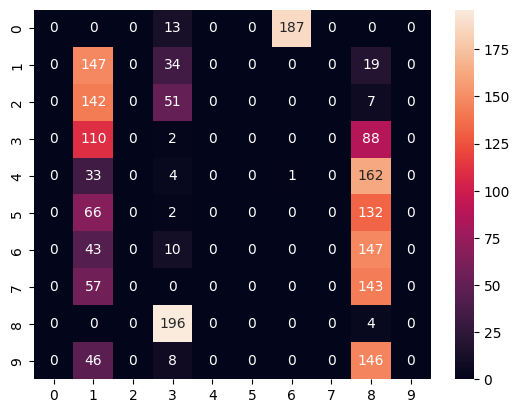

In [111]:
# Confusion matrix for m = 1.3
num_groups = u4_crisp_1.shape[1]
clusters4_1 = np.zeros((num_groups, num_groups))
rows = u4_crisp_1.shape[0] // num_groups
for h in range(num_groups):
    clusters4_1[h] = np.sum(u4_crisp_1[h*rows:(h+1)*rows], axis=0)
clusters4_1 = pd.DataFrame(clusters4_1.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters4_1, annot=True, fmt="d")

In [112]:
clusters4_1

,0,1,2,3,4,5,6,7,8,9
0,0,0,0,13,0,0,187,0,0,0
1,0,147,0,34,0,0,0,0,19,0
2,0,142,0,51,0,0,0,0,7,0
3,0,110,0,2,0,0,0,0,88,0
4,0,33,0,4,0,0,1,0,162,0
5,0,66,0,2,0,0,0,0,132,0
6,0,43,0,10,0,0,0,0,147,0
7,0,57,0,0,0,0,0,0,143,0
8,0,0,0,196,0,0,0,0,4,0
9,0,46,0,8,0,0,0,0,146,0


### <a id='toc3_2_3_'></a>[Dataset 2](#toc0_)

In [87]:
n_clusters = 10
m = 1.4
max_iter = 100
tol = 1e-6
random_state = 42

n_runs = 50

model_arrays_4_2 = []
metrics_4_2 = []
best_loss = np.inf
best_index_4_2 = None
for i in range(n_runs):
    print("="*50)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_4_2 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    # Dataset 2
    kfcm_4_2.fit(Xs[2], ys[2])
    metrics_4_2.append(kfcm_4_2.evaluate())
    model_arrays_4_2.append({
        "U": kfcm_4_2._U,
        "G": kfcm_4_2._G,
        "s": kfcm_4_2._s,
    })
    if metrics_4_2[i]["loss"] < best_loss:
        best_loss = metrics_4_2[i]["loss"]
        best_index_4_2 = i

-> Run 1/50
Iteration 1: J = 23.261507320256268
(2000,) (2000,)
{'accuracy': 0.4825, 'MPC': 0.09840000810159699, 'rand': 0.29489969091410767, 'loss': 23.261507320256268}
Iteration 2: J = 23.426787605304167
(2000,) (2000,)
{'accuracy': 0.492, 'MPC': 0.11482954642949972, 'rand': 0.3015415449301753, 'loss': 23.426787605304167}
Iteration 3: J = 23.347609487876934
(2000,) (2000,)
{'accuracy': 0.4955, 'MPC': 0.12483225176585877, 'rand': 0.31669454351263787, 'loss': 23.347609487876934}
Iteration 4: J = 23.284796931649467
(2000,) (2000,)
{'accuracy': 0.5135, 'MPC': 0.13433934838692219, 'rand': 0.33856651383146213, 'loss': 23.284796931649467}
Iteration 5: J = 23.214882820069462
(2000,) (2000,)
{'accuracy': 0.5305, 'MPC': 0.14514404993211139, 'rand': 0.35903739393166134, 'loss': 23.214882820069462}
Iteration 6: J = 23.108502235789427
(2000,) (2000,)
{'accuracy': 0.539, 'MPC': 0.15928982124833535, 'rand': 0.37072355817929636, 'loss': 23.108502235789427}
Iteration 7: J = 22.93836627983823
(2000,) 

In [88]:
best_index_4_2, metrics_4_2[best_index_4_2]

(11,
 {'accuracy': 0.5875,
  'MPC': 0.2611988397848356,
  'rand': 0.4149526973321809,
  'loss': 22.159347789416813})

In [89]:
# Metrics for m = 1.3
acc_vec4_2 = [metrics_4_2[i]["accuracy"] for i in range(n_runs)]
rand_vec4_2 = [metrics_4_2[i]["rand"] for i in range(n_runs)]
mpc_vec4_2 = [metrics_4_2[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec4_2):.4f}" + u" \u00b1 " + f"{np.std(acc_vec4_2):.4f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec4_2):.4f}" + u" \u00b1 " + f"{np.std(rand_vec4_2):.4f}")
print(f"Mean MPC: {np.mean(mpc_vec4_2):.4f}" + u" \u00b1 " + f"{np.std(mpc_vec4_2):.4f}")

Mean Accuracy: 0.5888 ± 0.0022
Mean Adjusted Rand Score: 0.4193 ± 0.0027
Mean MPC: 0.2635 ± 0.0007


In [113]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
# RODA DNV
best_u4_2 = np.array(model_arrays_4_2[best_index_4_2]["U"])
u4_crisp_2 = np.zeros_like(best_u4_2)
for k in range(best_u4_2.shape[0]):
    max_index = np.argmax(best_u4_2[k])
    u4_crisp_2[k][max_index] = 1

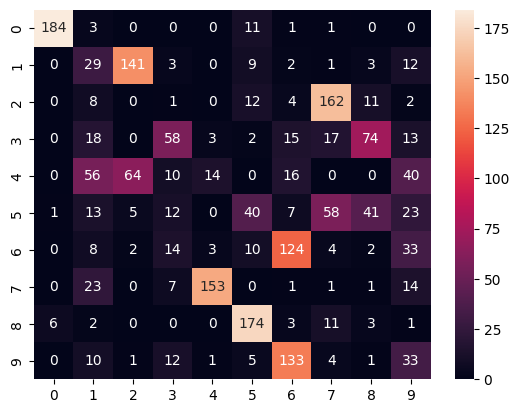

In [114]:
# Confusion matrix for m = 1.3
num_groups = u4_crisp_2.shape[1]
clusters4_2 = np.zeros((num_groups, num_groups))
rows = u4_crisp_2.shape[0] // num_groups
for h in range(num_groups):
    clusters4_2[h] = np.sum(u4_crisp_2[h*rows:(h+1)*rows], axis=0)
clusters4_2 = pd.DataFrame(clusters4_2.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters4_2, annot=True, fmt="d")

In [115]:
clusters4_2

,0,1,2,3,4,5,6,7,8,9
0,184,3,0,0,0,11,1,1,0,0
1,0,29,141,3,0,9,2,1,3,12
2,0,8,0,1,0,12,4,162,11,2
3,0,18,0,58,3,2,15,17,74,13
4,0,56,64,10,14,0,16,0,0,40
5,1,13,5,12,0,40,7,58,41,23
6,0,8,2,14,3,10,124,4,2,33
7,0,23,0,7,153,0,1,1,1,14
8,6,2,0,0,0,174,3,11,3,1
9,0,10,1,12,1,5,133,4,1,33


## <a id='toc3_2_'></a>[m = 1.5](#toc0_)

### <a id='toc3_2_1_'></a>[Dataset 0](#toc0_)

In [93]:
n_clusters = 10
m = 1.5
max_iter = 100
tol = 1e-6
n_runs = 50

model_arrays_5 = []
metrics_5 = []
best_loss = np.inf
best_index_5 = None
for i in range(n_runs):
    print("="*50)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_5 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    kfcm_5.fit(Xs[0], ys[0])
    metrics_5.append(kfcm_5.evaluate())
    model_arrays_5.append({
        "U": kfcm_5._U,
        "G": kfcm_5._G,
        "s": kfcm_5._s,
    })
    if metrics_5[i]["loss"] < best_loss:
        best_loss = metrics_5[i]["loss"]
        best_index_5 = i

-> Run 1/50
Iteration 1: J = 22.509084462507225
(2000,) (2000,)
{'accuracy': 0.542, 'MPC': 0.003210537269532021, 'rand': 0.3419692210719829, 'loss': 22.509084462507225}
Iteration 2: J = 22.541256633484714
(2000,) (2000,)
{'accuracy': 0.463, 'MPC': 0.006477088279863374, 'rand': 0.280141158765682, 'loss': 22.541256633484714}
Iteration 3: J = 22.45834628523197
(2000,) (2000,)
{'accuracy': 0.424, 'MPC': 0.014173736331602571, 'rand': 0.26883715719911777, 'loss': 22.45834628523197}
Iteration 4: J = 22.3331902350833
(2000,) (2000,)
{'accuracy': 0.4295, 'MPC': 0.029119856097467256, 'rand': 0.2753497799256897, 'loss': 22.3331902350833}
Iteration 5: J = 22.196712536238227
(2000,) (2000,)
{'accuracy': 0.4165, 'MPC': 0.048401697666357824, 'rand': 0.29459158304809185, 'loss': 22.196712536238227}
Iteration 6: J = 22.100227721472983
(2000,) (2000,)
{'accuracy': 0.4145, 'MPC': 0.06295763681076327, 'rand': 0.30488884665357674, 'loss': 22.100227721472983}
Iteration 7: J = 22.034688185066997
(2000,) (200

In [94]:
best_index_5, metrics_5[best_index_5]

(45,
 {'accuracy': 0.697,
  'MPC': 0.18516602686617378,
  'rand': 0.5171762091840589,
  'loss': 21.531468909235137})

In [95]:
# Metrics for m = 1.3
acc_vec5 = [metrics_5[i]["accuracy"] for i in range(n_runs)]
rand_vec5 = [metrics_5[i]["rand"] for i in range(n_runs)]
mpc_vec5 = [metrics_5[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec5):.5f}" + u" \u00b1 " + f"{np.std(acc_vec5):.5f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec5):.5f}" + u" \u00b1 " + f"{np.std(rand_vec5):.5f}")
print(f"Mean MPC: {np.mean(mpc_vec5):.5f}" + u" \u00b1 " + f"{np.std(mpc_vec5):.5f}")

Mean Accuracy: 0.60117 ± 0.07373
Mean Adjusted Rand Score: 0.43804 ± 0.06341
Mean MPC: 0.16584 ± 0.01599


In [96]:
# Crisp partition of the best result for m = 1.3
#best_u5 = pd.DataFrame(u3[best_j3])
#RODA DE NOVO
best_u5 = np.array(model_arrays_5[best_index_5]["U"])
u5_crisp = np.zeros_like(best_u5)
for k in range(best_u5.shape[0]):
    max_index = np.argmax(best_u5[k])
    u5_crisp[k][max_index] = 1

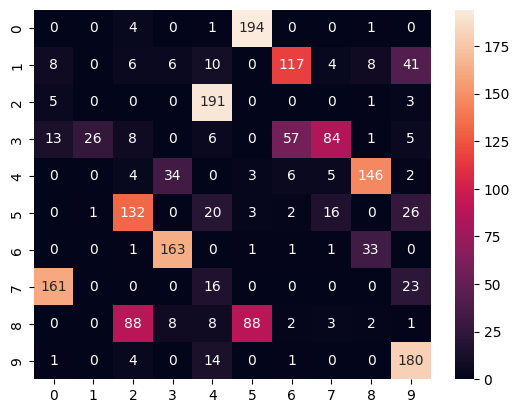

In [97]:
# Confusion matrix for m = 1.3
num_groups = u5_crisp.shape[1]
clusters5 = np.zeros((num_groups, num_groups))
rows = u5_crisp.shape[0] // num_groups
for h in range(num_groups):
    clusters5[h] = np.sum(u5_crisp[h*rows:(h+1)*rows], axis=0)
clusters5 = pd.DataFrame(clusters5.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters5, annot=True, fmt="d")

In [98]:
clusters5

,0,1,2,3,4,5,6,7,8,9
0,0,0,4,0,1,194,0,0,1,0
1,8,0,6,6,10,0,117,4,8,41
2,5,0,0,0,191,0,0,0,1,3
3,13,26,8,0,6,0,57,84,1,5
4,0,0,4,34,0,3,6,5,146,2
5,0,1,132,0,20,3,2,16,0,26
6,0,0,1,163,0,1,1,1,33,0
7,161,0,0,0,16,0,0,0,0,23
8,0,0,88,8,8,88,2,3,2,1
9,1,0,4,0,14,0,1,0,0,180


### <a id='toc3_2_2_'></a>[Dataset 1](#toc0_)

In [99]:
n_clusters = 10
m = 1.5
max_iter = 100
tol = 1e-6
random_state = 42

n_runs = 50

model_arrays_5_1 = []
metrics_5_1 = []
best_loss = np.inf
best_index_5_1 = None
for i in range(n_runs):
    print("="*50)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_5_1 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    # Dataset 1
    kfcm_5_1.fit(Xs[1], ys[1])
    metrics_5_1.append(kfcm_5_1.evaluate())
    model_arrays_5_1.append({
        "U": kfcm_5_1._U,
        "G": kfcm_5_1._G,
        "s": kfcm_5_1._s,
    })
    if metrics_5_1[i]["loss"] < best_loss:
        best_loss = metrics_5_1[i]["loss"]
        best_index_5_1 = i

-> Run 1/50
Iteration 1: J = 18.53363106561545
(2000,) (2000,)
{'accuracy': 0.4585, 'MPC': 0.00669215223477726, 'rand': 0.32464322588974925, 'loss': 18.53363106561545}
Iteration 2: J = 18.675412647554765
(2000,) (2000,)
{'accuracy': 0.412, 'MPC': 0.008740754705189535, 'rand': 0.282863570040512, 'loss': 18.675412647554765}
Iteration 3: J = 18.660997650632837
(2000,) (2000,)
{'accuracy': 0.371, 'MPC': 0.012036537218314991, 'rand': 0.2528889636734432, 'loss': 18.660997650632837}
Iteration 4: J = 18.652279177870057
(2000,) (2000,)
{'accuracy': 0.3655, 'MPC': 0.015895287163391725, 'rand': 0.2528083227016173, 'loss': 18.652279177870057}
Iteration 5: J = 18.650187414607842
(2000,) (2000,)
{'accuracy': 0.351, 'MPC': 0.01946922021799713, 'rand': 0.23678947175414397, 'loss': 18.650187414607842}
Iteration 6: J = 18.652858212429056
(2000,) (2000,)
{'accuracy': 0.3215, 'MPC': 0.02222609612618387, 'rand': 0.21210707164239695, 'loss': 18.652858212429056}
Iteration 7: J = 18.656544086239098
(2000,) (2

In [100]:
best_index_5_1, metrics_5_1[best_index_5_1]

(34,
 {'accuracy': 0.201,
  'MPC': 1.0483662203131239e-05,
  'rand': 0.11857359114965474,
  'loss': 18.674436566402232})

In [101]:
# Metrics for m = 1.3
acc_vec5_1 = [metrics_5_1[i]["accuracy"] for i in range(n_runs)]
rand_vec5_1 = [metrics_5_1[i]["rand"] for i in range(n_runs)]
mpc_vec5_1 = [metrics_5_1[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec5_1):.5f}" + u" \u00b1 " + f"{np.std(acc_vec5_1):.5f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec5_1):.5f}" + u" \u00b1 " + f"{np.std(rand_vec5_1):.5f}")
print(f"Mean MPC: {np.mean(mpc_vec5_1):.5f}" + u" \u00b1 " + f"{np.std(mpc_vec5_1):.5f}")

Mean Accuracy: 0.27486 ± 0.01651
Mean Adjusted Rand Score: 0.17850 ± 0.01385
Mean MPC: 0.02970 ± 0.00746


In [ ]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
# RODA DNVB
best_u5_1 = np.array(model_arrays_5_1[best_index_5_1]["U"])
u5_crisp_1 = np.zeros_like(best_u5_1)
for k in range(best_u5_1.shape[0]):
    max_index = np.argmax(best_u5_1[k])
    u5_crisp_1[k][max_index] = 1

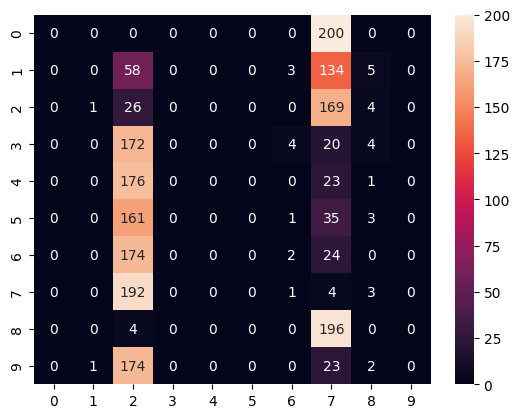

In [ ]:
# Confusion matrix for m = 1.3
num_groups = u5_crisp_1.shape[1]
clusters5_1 = np.zeros((num_groups, num_groups))
rows = u5_crisp_1.shape[0] // num_groups
for h in range(num_groups):
    clusters5_1[h] = np.sum(u5_crisp_1[h*rows:(h+1)*rows], axis=0)
clusters5_1 = pd.DataFrame(clusters5_1.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters5_1, annot=True, fmt="d")

In [ ]:
clusters5_1

,0,1,2,3,4,5,6,7,8,9
0,0,0,0,0,0,0,0,200,0,0
1,0,0,58,0,0,0,3,134,5,0
2,0,1,26,0,0,0,0,169,4,0
3,0,0,172,0,0,0,4,20,4,0
4,0,0,176,0,0,0,0,23,1,0
5,0,0,161,0,0,0,1,35,3,0
6,0,0,174,0,0,0,2,24,0,0
7,0,0,192,0,0,0,1,4,3,0
8,0,0,4,0,0,0,0,196,0,0
9,0,1,174,0,0,0,0,23,2,0


### <a id='toc3_2_3_'></a>[Dataset 2](#toc0_)

In [105]:
n_clusters = 10
m = 1.5
max_iter = 100
tol = 1e-6

n_runs = 50

model_arrays_5_2 = []
metrics_5_2 = []
best_loss = np.inf
best_index_5_2 = None
for i in range(n_runs):
    print("="*50)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_5_2 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    # Dataset 2
    kfcm_5_2.fit(Xs[2], ys[2])
    metrics_5_2.append(kfcm_5_2.evaluate())
    model_arrays_5_2.append({
        "U": kfcm_5_2._U,
        "G": kfcm_5_2._G,
        "s": kfcm_5_2._s,
    })
    if metrics_5_2[i]["loss"] < best_loss:
        best_loss = metrics_5_2[i]["loss"]
        best_index_5_2 = i

-> Run 1/50
Iteration 1: J = 18.85213901627026
(2000,) (2000,)
{'accuracy': 0.47, 'MPC': 0.0561306345656829, 'rand': 0.2905855887834317, 'loss': 18.85213901627026}
Iteration 2: J = 19.049147611709756
(2000,) (2000,)
{'accuracy': 0.471, 'MPC': 0.06738143041627276, 'rand': 0.29101434566689677, 'loss': 19.049147611709756}
Iteration 3: J = 19.02667274246869
(2000,) (2000,)
{'accuracy': 0.464, 'MPC': 0.07219275380547663, 'rand': 0.2941638165184499, 'loss': 19.02667274246869}
Iteration 4: J = 19.02457158044338
(2000,) (2000,)
{'accuracy': 0.4605, 'MPC': 0.0744161302815407, 'rand': 0.28773530486351684, 'loss': 19.02457158044338}
Iteration 5: J = 19.027298568855525
(2000,) (2000,)
{'accuracy': 0.457, 'MPC': 0.0758456006095064, 'rand': 0.28536910903608464, 'loss': 19.027298568855525}
Iteration 6: J = 19.030938076332202
(2000,) (2000,)
{'accuracy': 0.457, 'MPC': 0.07698194299476424, 'rand': 0.290374929063147, 'loss': 19.030938076332202}
Iteration 7: J = 19.034031167831372
(2000,) (2000,)
{'accur

In [ ]:
best_index_5_2, metrics_5_2[best_index_5_2]

(43,
 {'accuracy': 0.601,
  'MPC': 0.47276314338832626,
  'rand': 0.42703397247148683,
  'loss': 25.488372727371125})

In [106]:
# Metrics for m = 1.3
acc_vec5_2 = [metrics_5_2[i]["accuracy"] for i in range(n_runs)]
rand_vec5_2 = [metrics_5_2[i]["rand"] for i in range(n_runs)]
mpc_vec5_2 = [metrics_5_2[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec5_2):.5f}" + u" \u00b1 " + f"{np.std(acc_vec5_2):.5f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec5_2):.5f}" + u" \u00b1 " + f"{np.std(rand_vec5_2):.5f}")
print(f"Mean MPC: {np.mean(mpc_vec5_2):.5f}" + u" \u00b1 " + f"{np.std(mpc_vec5_2):.5f}")

Mean Accuracy: 0.46711 ± 0.00286
Mean Adjusted Rand Score: 0.33108 ± 0.00236
Mean MPC: 0.13983 ± 0.00089


In [107]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
best_u5_2 = np.array(model_arrays_5_2[best_index_5_2]["U"])
u5_crisp_2 = np.zeros_like(best_u5_2)
for k in range(best_u5_2.shape[0]):
    max_index = np.argmax(best_u5_2[k])
    u5_crisp_2[k][max_index] = 1

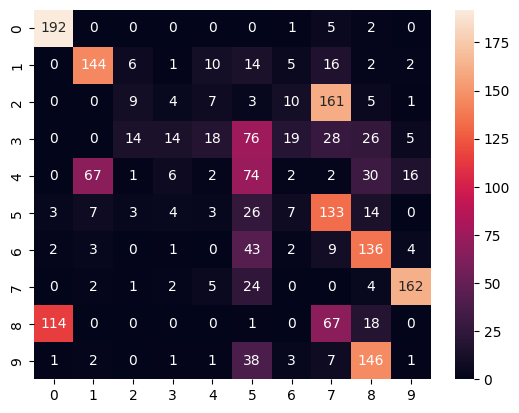

In [108]:
# Confusion matrix for m = 1.3
num_groups = u5_crisp_2.shape[1]
clusters5_2 = np.zeros((num_groups, num_groups))
rows = u5_crisp_2.shape[0] // num_groups
for h in range(num_groups):
    clusters5_2[h] = np.sum(u5_crisp_2[h*rows:(h+1)*rows], axis=0)
clusters5_2 = pd.DataFrame(clusters5_2.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters5_2, annot=True, fmt="d")

In [109]:
clusters5_2

,0,1,2,3,4,5,6,7,8,9
0,192,0,0,0,0,0,1,5,2,0
1,0,144,6,1,10,14,5,16,2,2
2,0,0,9,4,7,3,10,161,5,1
3,0,0,14,14,18,76,19,28,26,5
4,0,67,1,6,2,74,2,2,30,16
5,3,7,3,4,3,26,7,133,14,0
6,2,3,0,1,0,43,2,9,136,4
7,0,2,1,2,5,24,0,0,4,162
8,114,0,0,0,0,1,0,67,18,0
9,1,2,0,1,1,38,3,7,146,1


## <a id='toc3_2_'></a>[m = 1.6](#toc0_)

### <a id='toc3_2_1_'></a>[Dataset 0](#toc0_)

In [118]:
n_clusters = 10
m = 1.6
max_iter = 100
tol = 1e-6
n_runs = 50

model_arrays_6 = []
metrics_6 = []
best_loss = np.inf
best_index_6 = None
for i in range(n_runs):
    print("="*60)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_6 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    kfcm_6.fit(Xs[0], ys[0])
    metrics_6.append(kfcm_6.evaluate())
    model_arrays_6.append({
        "U": kfcm_6._U,
        "G": kfcm_6._G,
        "s": kfcm_6._s,
    })
    if metrics_6[i]["loss"] < best_loss:
        best_loss = metrics_6[i]["loss"]
        best_index_6 = i

-> Run 1/50
Iteration 1: J = 17.634347121079713
(2000,) (2000,)
{'accuracy': 0.5045, 'MPC': 0.0014243375941399572, 'rand': 0.36106289042789075, 'loss': 17.634347121079713}
Iteration 2: J = 17.952767914144616
(2000,) (2000,)
{'accuracy': 0.423, 'MPC': 0.001960451199110591, 'rand': 0.2797000480062534, 'loss': 17.952767914144616}
Iteration 3: J = 17.940932943428777
(2000,) (2000,)
{'accuracy': 0.3905, 'MPC': 0.0030259040147250227, 'rand': 0.23807224571292263, 'loss': 17.940932943428777}
Iteration 4: J = 17.927132223582728
(2000,) (2000,)
{'accuracy': 0.3655, 'MPC': 0.004803886667001378, 'rand': 0.2193598105933906, 'loss': 17.927132223582728}
Iteration 5: J = 17.908633963751516
(2000,) (2000,)
{'accuracy': 0.3545, 'MPC': 0.007656154810562699, 'rand': 0.21661862351221395, 'loss': 17.908633963751516}
Iteration 6: J = 17.88255919382583
(2000,) (2000,)
{'accuracy': 0.3535, 'MPC': 0.012164208382761665, 'rand': 0.22398543157814643, 'loss': 17.88255919382583}
Iteration 7: J = 17.844930585925148
(

In [119]:
best_index_6, metrics_6[best_index_6]

(27,
 {'accuracy': 0.431,
  'MPC': 0.09055564388360615,
  'rand': 0.32025515937766247,
  'loss': 17.585327672384892})

In [120]:
# Metrics for m = 1.3
acc_vec6 = [metrics_6[i]["accuracy"] for i in range(n_runs)]
rand_vec6 = [metrics_6[i]["rand"] for i in range(n_runs)]
mpc_vec6 = [metrics_6[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec6):.6f}" + u" \u00b1 " + f"{np.std(acc_vec6):.6f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec6):.6f}" + u" \u00b1 " + f"{np.std(rand_vec6):.6f}")
print(f"Mean MPC: {np.mean(mpc_vec6):.6f}" + u" \u00b1 " + f"{np.std(mpc_vec6):.6f}")

Mean Accuracy: 0.452410 ± 0.023709
Mean Adjusted Rand Score: 0.325446 ± 0.005494
Mean MPC: 0.091515 ± 0.001235


In [121]:
# Crisp partition of the best result for m = 1.3
#best_u6 = pd.DataFrame(u3[best_j3])
#RODA DE NOVO
best_u6 = np.array(model_arrays_6[best_index_6]["U"])
u6_crisp = np.zeros_like(best_u6)
for k in range(best_u6.shape[0]):
    max_index = np.argmax(best_u6[k])
    u6_crisp[k][max_index] = 1

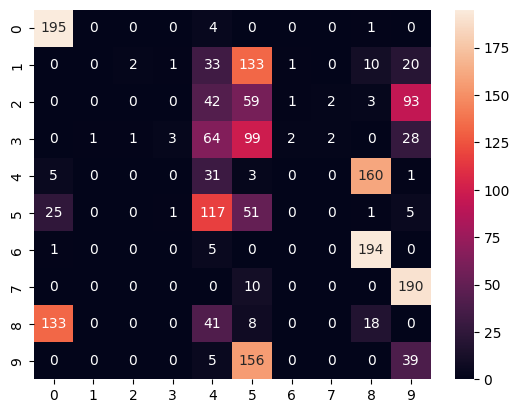

In [122]:
# Confusion matrix for m = 1.3
num_groups = u6_crisp.shape[1]
clusters6 = np.zeros((num_groups, num_groups))
rows = u6_crisp.shape[0] // num_groups
for h in range(num_groups):
    clusters6[h] = np.sum(u6_crisp[h*rows:(h+1)*rows], axis=0)
clusters6 = pd.DataFrame(clusters6.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters6, annot=True, fmt="d")

In [123]:
clusters6

,0,1,2,3,4,5,6,7,8,9
0,195,0,0,0,4,0,0,0,1,0
1,0,0,2,1,33,133,1,0,10,20
2,0,0,0,0,42,59,1,2,3,93
3,0,1,1,3,64,99,2,2,0,28
4,5,0,0,0,31,3,0,0,160,1
5,25,0,0,1,117,51,0,0,1,5
6,1,0,0,0,5,0,0,0,194,0
7,0,0,0,0,0,10,0,0,0,190
8,133,0,0,0,41,8,0,0,18,0
9,0,0,0,0,5,156,0,0,0,39


### <a id='toc3_2_2_'></a>[Dataset 1](#toc0_)

In [125]:
n_clusters = 10
m = 1.6
max_iter = 100
tol = 1e-6
random_state = 42

n_runs = 50

model_arrays_6_1 = []
metrics_6_1 = []
best_loss = np.inf
best_index_6_1 = None
for i in range(n_runs):
    print("="*60)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_6_1 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    # Dataset 1
    kfcm_6_1.fit(Xs[1], ys[1])
    metrics_6_1.append(kfcm_6_1.evaluate())
    model_arrays_6_1.append({
        "U": kfcm_6_1._U,
        "G": kfcm_6_1._G,
        "s": kfcm_6_1._s,
    })
    if metrics_6_1[i]["loss"] < best_loss:
        best_loss = metrics_6_1[i]["loss"]
        best_index_6_1 = i

-> Run 1/50
Iteration 1: J = 14.772347731300801
(2000,) (2000,)
{'accuracy': 0.491, 'MPC': 0.0024547499003757522, 'rand': 0.3022166799557276, 'loss': 14.772347731300801}
Iteration 2: J = 14.856596338042538
(2000,) (2000,)
{'accuracy': 0.421, 'MPC': 0.001858901069416552, 'rand': 0.2685706905856896, 'loss': 14.856596338042538}
Iteration 3: J = 14.85156968217756
(2000,) (2000,)
{'accuracy': 0.3655, 'MPC': 0.001572852743635056, 'rand': 0.2104826290623331, 'loss': 14.85156968217756}
Iteration 4: J = 14.848876806926707
(2000,) (2000,)
{'accuracy': 0.3045, 'MPC': 0.0013574439484856926, 'rand': 0.1703012900858621, 'loss': 14.848876806926707}
Iteration 5: J = 14.84679496287571
(2000,) (2000,)
{'accuracy': 0.267, 'MPC': 0.0011779050378063483, 'rand': 0.15599870620889159, 'loss': 14.84679496287571}
Iteration 6: J = 14.845064406404976
(2000,) (2000,)
{'accuracy': 0.257, 'MPC': 0.0010240231028024738, 'rand': 0.1512347932241522, 'loss': 14.845064406404976}
Iteration 7: J = 14.843588167019654
(2000,)

In [126]:
best_index_6_1, metrics_6_1[best_index_6_1]

(7,
 {'accuracy': 0.1975,
  'MPC': 1.2657200687549164e-07,
  'rand': 0.115626136845784,
  'loss': 14.833574011796983})

In [127]:
# Metrics for m = 1.3
acc_vec6_1 = [metrics_6_1[i]["accuracy"] for i in range(n_runs)]
rand_vec6_1 = [metrics_6_1[i]["rand"] for i in range(n_runs)]
mpc_vec6_1 = [metrics_6_1[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec6_1):.6f}" + u" \u00b1 " + f"{np.std(acc_vec6_1):.6f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec6_1):.6f}" + u" \u00b1 " + f"{np.std(rand_vec6_1):.6f}")
print(f"Mean MPC: {np.mean(mpc_vec6_1):.6f}" + u" \u00b1 " + f"{np.std(mpc_vec6_1):.6f}")

Mean Accuracy: 0.224420 ± 0.039102
Mean Adjusted Rand Score: 0.132858 ± 0.029321
Mean MPC: 0.005377 ± 0.007492


In [128]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
# RODA DNVB
best_u6_1 = np.array(model_arrays_6_1[best_index_6_1]["U"])
u6_crisp_1 = np.zeros_like(best_u6_1)
for k in range(best_u6_1.shape[0]):
    max_index = np.argmax(best_u6_1[k])
    u6_crisp_1[k][max_index] = 1

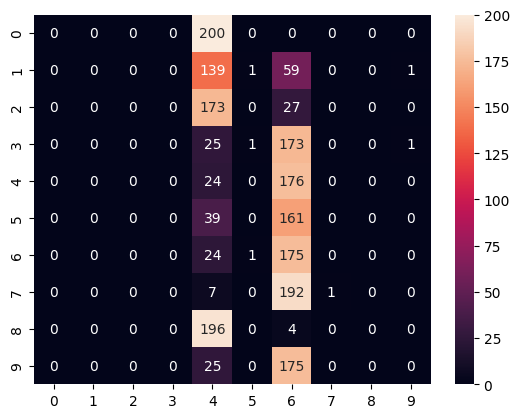

In [129]:
# Confusion matrix for m = 1.3
num_groups = u6_crisp_1.shape[1]
clusters6_1 = np.zeros((num_groups, num_groups))
rows = u6_crisp_1.shape[0] // num_groups
for h in range(num_groups):
    clusters6_1[h] = np.sum(u6_crisp_1[h*rows:(h+1)*rows], axis=0)
clusters6_1 = pd.DataFrame(clusters6_1.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters6_1, annot=True, fmt="d")

In [130]:
clusters6_1

,0,1,2,3,4,5,6,7,8,9
0,0,0,0,0,200,0,0,0,0,0
1,0,0,0,0,139,1,59,0,0,1
2,0,0,0,0,173,0,27,0,0,0
3,0,0,0,0,25,1,173,0,0,1
4,0,0,0,0,24,0,176,0,0,0
5,0,0,0,0,39,0,161,0,0,0
6,0,0,0,0,24,1,175,0,0,0
7,0,0,0,0,7,0,192,1,0,0
8,0,0,0,0,196,0,4,0,0,0
9,0,0,0,0,25,0,175,0,0,0


### <a id='toc3_2_3_'></a>[Dataset 2](#toc0_)

In [131]:
n_clusters = 10
m = 1.6
max_iter = 100
tol = 1e-6

n_runs = 50

model_arrays_6_2 = []
metrics_6_2 = []
best_loss = np.inf
best_index_6_2 = None
for i in range(n_runs):
    print("="*60)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_6_2 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    # Dataset 2
    kfcm_6_2.fit(Xs[2], ys[2])
    metrics_6_2.append(kfcm_6_2.evaluate())
    model_arrays_6_2.append({
        "U": kfcm_6_2._U,
        "G": kfcm_6_2._G,
        "s": kfcm_6_2._s,
    })
    if metrics_6_2[i]["loss"] < best_loss:
        best_loss = metrics_6_2[i]["loss"]
        best_index_6_2 = i

-> Run 1/50
Iteration 1: J = 15.152665500924833
(2000,) (2000,)
{'accuracy': 0.46, 'MPC': 0.032816306240076476, 'rand': 0.28481684544101504, 'loss': 15.152665500924833}
Iteration 2: J = 15.342636131187971
(2000,) (2000,)
{'accuracy': 0.445, 'MPC': 0.03955168397678199, 'rand': 0.2850931799628939, 'loss': 15.342636131187971}
Iteration 3: J = 15.321472300780695
(2000,) (2000,)
{'accuracy': 0.4235, 'MPC': 0.043912521329981136, 'rand': 0.271921530621188, 'loss': 15.321472300780695}
Iteration 4: J = 15.319326912281785
(2000,) (2000,)
{'accuracy': 0.4095, 'MPC': 0.045854227101595146, 'rand': 0.26445484655522244, 'loss': 15.319326912281785}
Iteration 5: J = 15.320802908565199
(2000,) (2000,)
{'accuracy': 0.3975, 'MPC': 0.04659638083037121, 'rand': 0.2571456594150519, 'loss': 15.320802908565199}
Iteration 6: J = 15.322529449907282
(2000,) (2000,)
{'accuracy': 0.39, 'MPC': 0.04684149415332084, 'rand': 0.2551483793868773, 'loss': 15.322529449907282}
Iteration 7: J = 15.323894756466062
(2000,) (20

In [132]:
best_index_6_2, metrics_6_2[best_index_6_2]

(46,
 {'accuracy': 0.4365,
  'MPC': 0.08295725086796046,
  'rand': 0.2758730550904015,
  'loss': 15.223034891685735})

In [133]:
# Metrics for m = 1.3
acc_vec6_2 = [metrics_6_2[i]["accuracy"] for i in range(n_runs)]
rand_vec6_2 = [metrics_6_2[i]["rand"] for i in range(n_runs)]
mpc_vec6_2 = [metrics_6_2[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec6_2):.6f}" + u" \u00b1 " + f"{np.std(acc_vec6_2):.6f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec6_2):.6f}" + u" \u00b1 " + f"{np.std(rand_vec6_2):.6f}")
print(f"Mean MPC: {np.mean(mpc_vec6_2):.6f}" + u" \u00b1 " + f"{np.std(mpc_vec6_2):.6f}")

Mean Accuracy: 0.422770 ± 0.021385
Mean Adjusted Rand Score: 0.260880 ± 0.021551
Mean MPC: 0.072498 ± 0.010828


In [134]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
best_u6_2 = np.array(model_arrays_6_2[best_index_6_2]["U"])
u6_crisp_2 = np.zeros_like(best_u6_2)
for k in range(best_u6_2.shape[0]):
    max_index = np.argmax(best_u6_2[k])
    u6_crisp_2[k][max_index] = 1

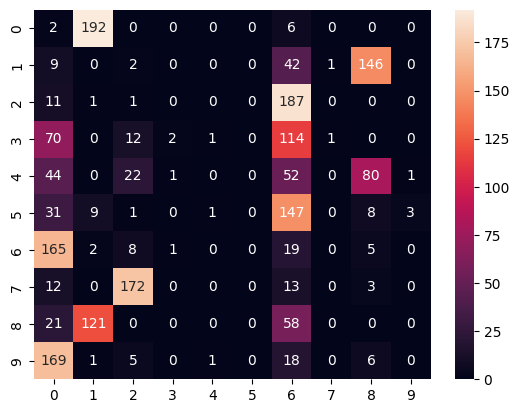

In [135]:
# Confusion matrix for m = 1.3
num_groups = u6_crisp_2.shape[1]
clusters6_2 = np.zeros((num_groups, num_groups))
rows = u6_crisp_2.shape[0] // num_groups
for h in range(num_groups):
    clusters6_2[h] = np.sum(u6_crisp_2[h*rows:(h+1)*rows], axis=0)
clusters6_2 = pd.DataFrame(clusters6_2.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters6_2, annot=True, fmt="d")

In [136]:
clusters6_2

,0,1,2,3,4,5,6,7,8,9
0,2,192,0,0,0,0,6,0,0,0
1,9,0,2,0,0,0,42,1,146,0
2,11,1,1,0,0,0,187,0,0,0
3,70,0,12,2,1,0,114,1,0,0
4,44,0,22,1,0,0,52,0,80,1
5,31,9,1,0,1,0,147,0,8,3
6,165,2,8,1,0,0,19,0,5,0
7,12,0,172,0,0,0,13,0,3,0
8,21,121,0,0,0,0,58,0,0,0
9,169,1,5,0,1,0,18,0,6,0


## <a id='toc3_2_'></a>[m = 1.7](#toc0_)

### <a id='toc3_2_1_'></a>[Dataset 0](#toc0_)

In [137]:
n_clusters = 10
m = 1.7
max_iter = 100
tol = 1e-6
n_runs = 50

model_arrays_7 = []
metrics_7 = []
best_loss = np.inf
best_index_7 = None
for i in range(n_runs):
    print("="*70)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_7 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    kfcm_7.fit(Xs[0], ys[0])
    metrics_7.append(kfcm_7.evaluate())
    model_arrays_7.append({
        "U": kfcm_7._U,
        "G": kfcm_7._G,
        "s": kfcm_7._s,
    })
    if metrics_7[i]["loss"] < best_loss:
        best_loss = metrics_7[i]["loss"]
        best_index_7 = i

-> Run 1/50
Iteration 1: J = 14.236621000641572
(2000,) (2000,)
{'accuracy': 0.5405, 'MPC': 0.0010605450223606372, 'rand': 0.33994252188367197, 'loss': 14.236621000641572}
Iteration 2: J = 14.269465120562751
(2000,) (2000,)
{'accuracy': 0.439, 'MPC': 0.0011837321221045416, 'rand': 0.2673124263831122, 'loss': 14.269465120562751}
Iteration 3: J = 14.265981266421006
(2000,) (2000,)
{'accuracy': 0.3905, 'MPC': 0.0014591534168684195, 'rand': 0.24408721273132022, 'loss': 14.265981266421006}
Iteration 4: J = 14.264144326469273
(2000,) (2000,)
{'accuracy': 0.3625, 'MPC': 0.001850579498697491, 'rand': 0.22893221677528264, 'loss': 14.264144326469273}
Iteration 5: J = 14.262704755863586
(2000,) (2000,)
{'accuracy': 0.3545, 'MPC': 0.002360686699183212, 'rand': 0.22490508066739054, 'loss': 14.262704755863586}
Iteration 6: J = 14.261430970402523
(2000,) (2000,)
{'accuracy': 0.35, 'MPC': 0.0030022686662259934, 'rand': 0.22595306767621523, 'loss': 14.261430970402523}
Iteration 7: J = 14.26013214396707

In [138]:
best_index_7, metrics_7[best_index_7]

(46,
 {'accuracy': 0.425,
  'MPC': 0.047935175688323395,
  'rand': 0.3114384994287235,
  'loss': 14.19146764934297})

In [139]:
# Metrics for m = 1.3
acc_vec7 = [metrics_7[i]["accuracy"] for i in range(n_runs)]
rand_vec7 = [metrics_7[i]["rand"] for i in range(n_runs)]
mpc_vec7 = [metrics_7[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec7):.7f}" + u" \u00b1 " + f"{np.std(acc_vec7):.7f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec7):.7f}" + u" \u00b1 " + f"{np.std(rand_vec7):.7f}")
print(f"Mean MPC: {np.mean(mpc_vec7):.7f}" + u" \u00b1 " + f"{np.std(mpc_vec7):.7f}")

Mean Accuracy: 0.4245700 ± 0.0038717
Mean Adjusted Rand Score: 0.3216281 ± 0.0044085
Mean MPC: 0.0561769 ± 0.0024173


In [140]:
# Crisp partition of the best result for m = 1.3
#best_u7 = pd.DataFrame(u3[best_j3])
#RODA DE NOVO
best_u7 = np.array(model_arrays_7[best_index_7]["U"])
u7_crisp = np.zeros_like(best_u7)
for k in range(best_u7.shape[0]):
    max_index = np.argmax(best_u7[k])
    u7_crisp[k][max_index] = 1

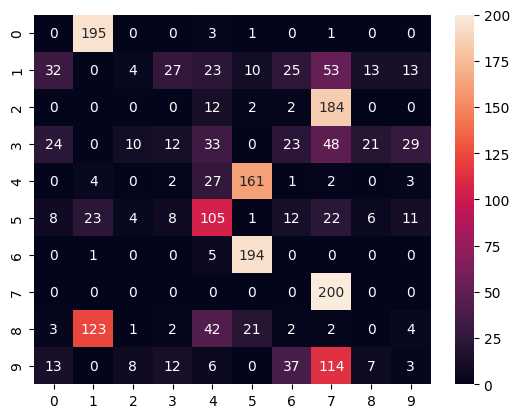

In [141]:
# Confusion matrix for m = 1.3
num_groups = u7_crisp.shape[1]
clusters7 = np.zeros((num_groups, num_groups))
rows = u7_crisp.shape[0] // num_groups
for h in range(num_groups):
    clusters7[h] = np.sum(u7_crisp[h*rows:(h+1)*rows], axis=0)
clusters7 = pd.DataFrame(clusters7.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters7, annot=True, fmt="d")

In [142]:
clusters7

,0,1,2,3,4,5,6,7,8,9
0,0,195,0,0,3,1,0,1,0,0
1,32,0,4,27,23,10,25,53,13,13
2,0,0,0,0,12,2,2,184,0,0
3,24,0,10,12,33,0,23,48,21,29
4,0,4,0,2,27,161,1,2,0,3
5,8,23,4,8,105,1,12,22,6,11
6,0,1,0,0,5,194,0,0,0,0
7,0,0,0,0,0,0,0,200,0,0
8,3,123,1,2,42,21,2,2,0,4
9,13,0,8,12,6,0,37,114,7,3


### <a id='toc3_2_2_'></a>[Dataset 1](#toc0_)

In [143]:
n_clusters = 10
m = 1.7
max_iter = 100
tol = 1e-6
random_state = 42

n_runs = 50

model_arrays_7_1 = []
metrics_7_1 = []
best_loss = np.inf
best_index_7_1 = None
for i in range(n_runs):
    print("="*70)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_7_1 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    # Dataset 1
    kfcm_7_1.fit(Xs[1], ys[1])
    metrics_7_1.append(kfcm_7_1.evaluate())
    model_arrays_7_1.append({
        "U": kfcm_7_1._U,
        "G": kfcm_7_1._G,
        "s": kfcm_7_1._s,
    })
    if metrics_7_1[i]["loss"] < best_loss:
        best_loss = metrics_7_1[i]["loss"]
        best_index_7_1 = i

-> Run 1/50
Iteration 1: J = 11.707161851973954
(2000,) (2000,)
{'accuracy': 0.4565, 'MPC': 0.0020290070873484334, 'rand': 0.32158897446492185, 'loss': 11.707161851973954}
Iteration 2: J = 11.807713590867262
(2000,) (2000,)
{'accuracy': 0.4035, 'MPC': 0.001501283398783415, 'rand': 0.2637609130718699, 'loss': 11.807713590867262}
Iteration 3: J = 11.800797117182826
(2000,) (2000,)
{'accuracy': 0.3395, 'MPC': 0.0011838654924942738, 'rand': 0.20957153355178135, 'loss': 11.800797117182826}
Iteration 4: J = 11.79698354745113
(2000,) (2000,)
{'accuracy': 0.306, 'MPC': 0.000930923202389411, 'rand': 0.17715177903132293, 'loss': 11.79698354745113}
Iteration 5: J = 11.794065288299988
(2000,) (2000,)
{'accuracy': 0.2605, 'MPC': 0.0007208757319262515, 'rand': 0.15022900100167297, 'loss': 11.794065288299988}
Iteration 6: J = 11.79165834614306
(2000,) (2000,)
{'accuracy': 0.2385, 'MPC': 0.0005471121644058385, 'rand': 0.1410754692285699, 'loss': 11.79165834614306}
Iteration 7: J = 11.789634513454818
(

In [144]:
best_index_7_1, metrics_7_1[best_index_7_1]

(22,
 {'accuracy': 0.198,
  'MPC': 4.214615934028387e-08,
  'rand': 0.11570633132068826,
  'loss': 11.782725993966578})

In [145]:
# Metrics for m = 1.3
acc_vec7_1 = [metrics_7_1[i]["accuracy"] for i in range(n_runs)]
rand_vec7_1 = [metrics_7_1[i]["rand"] for i in range(n_runs)]
mpc_vec7_1 = [metrics_7_1[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec7_1):.7f}" + u" \u00b1 " + f"{np.std(acc_vec7_1):.7f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec7_1):.7f}" + u" \u00b1 " + f"{np.std(rand_vec7_1):.7f}")
print(f"Mean MPC: {np.mean(mpc_vec7_1):.7f}" + u" \u00b1 " + f"{np.std(mpc_vec7_1):.7f}")

Mean Accuracy: 0.1976400 ± 0.0002653
Mean Adjusted Rand Score: 0.1156921 ± 0.0000328
Mean MPC: 0.0000001 ± 0.0000000


In [146]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
# RODA DNVB
best_u7_1 = np.array(model_arrays_7_1[best_index_7_1]["U"])
u7_crisp_1 = np.zeros_like(best_u7_1)
for k in range(best_u7_1.shape[0]):
    max_index = np.argmax(best_u7_1[k])
    u7_crisp_1[k][max_index] = 1

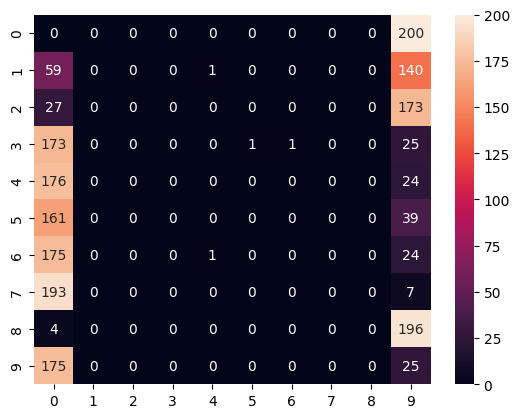

In [147]:
# Confusion matrix for m = 1.3
num_groups = u7_crisp_1.shape[1]
clusters7_1 = np.zeros((num_groups, num_groups))
rows = u7_crisp_1.shape[0] // num_groups
for h in range(num_groups):
    clusters7_1[h] = np.sum(u7_crisp_1[h*rows:(h+1)*rows], axis=0)
clusters7_1 = pd.DataFrame(clusters7_1.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters7_1, annot=True, fmt="d")

In [148]:
clusters7_1

,0,1,2,3,4,5,6,7,8,9
0,0,0,0,0,0,0,0,0,0,200
1,59,0,0,0,1,0,0,0,0,140
2,27,0,0,0,0,0,0,0,0,173
3,173,0,0,0,0,1,1,0,0,25
4,176,0,0,0,0,0,0,0,0,24
5,161,0,0,0,0,0,0,0,0,39
6,175,0,0,0,1,0,0,0,0,24
7,193,0,0,0,0,0,0,0,0,7
8,4,0,0,0,0,0,0,0,0,196
9,175,0,0,0,0,0,0,0,0,25


### <a id='toc3_2_3_'></a>[Dataset 2](#toc0_)

In [149]:
n_clusters = 10
m = 1.7
max_iter = 100
tol = 1e-6

n_runs = 50

model_arrays_7_2 = []
metrics_7_2 = []
best_loss = np.inf
best_index_7_2 = None
for i in range(n_runs):
    print("="*70)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_7_2 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    # Dataset 2
    kfcm_7_2.fit(Xs[2], ys[2])
    metrics_7_2.append(kfcm_7_2.evaluate())
    model_arrays_7_2.append({
        "U": kfcm_7_2._U,
        "G": kfcm_7_2._G,
        "s": kfcm_7_2._s,
    })
    if metrics_7_2[i]["loss"] < best_loss:
        best_loss = metrics_7_2[i]["loss"]
        best_index_7_2 = i

-> Run 1/50
Iteration 1: J = 12.122518071940613
(2000,) (2000,)
{'accuracy': 0.4465, 'MPC': 0.02015843584483612, 'rand': 0.28165363903229107, 'loss': 12.122518071940613}
Iteration 2: J = 12.294456090848591
(2000,) (2000,)
{'accuracy': 0.431, 'MPC': 0.022824607801317676, 'rand': 0.28064691901431355, 'loss': 12.294456090848591}
Iteration 3: J = 12.275260940615784
(2000,) (2000,)
{'accuracy': 0.406, 'MPC': 0.025837604366645284, 'rand': 0.26215504935088346, 'loss': 12.275260940615784}
Iteration 4: J = 12.268312898930084
(2000,) (2000,)
{'accuracy': 0.389, 'MPC': 0.027996958711582587, 'rand': 0.25332553068064867, 'loss': 12.268312898930084}
Iteration 5: J = 12.265708302297543
(2000,) (2000,)
{'accuracy': 0.381, 'MPC': 0.029301608790371136, 'rand': 0.24972936393175105, 'loss': 12.265708302297543}
Iteration 6: J = 12.26458281850472
(2000,) (2000,)
{'accuracy': 0.373, 'MPC': 0.030011946540658863, 'rand': 0.2435799041230178, 'loss': 12.26458281850472}
Iteration 7: J = 12.26378615058023
(2000,) 

In [150]:
best_index_7_2, metrics_7_2[best_index_7_2]

(0,
 {'accuracy': 0.296,
  'MPC': 0.02964935591210327,
  'rand': 0.16273244950990984,
  'loss': 12.249629007089066})

In [151]:
# Metrics for m = 1.3
acc_vec7_2 = [metrics_7_2[i]["accuracy"] for i in range(n_runs)]
rand_vec7_2 = [metrics_7_2[i]["rand"] for i in range(n_runs)]
mpc_vec7_2 = [metrics_7_2[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec7_2):.7f}" + u" \u00b1 " + f"{np.std(acc_vec7_2):.7f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec7_2):.7f}" + u" \u00b1 " + f"{np.std(rand_vec7_2):.7f}")
print(f"Mean MPC: {np.mean(mpc_vec7_2):.7f}" + u" \u00b1 " + f"{np.std(mpc_vec7_2):.7f}")

Mean Accuracy: 0.3021000 ± 0.0024434
Mean Adjusted Rand Score: 0.1661062 ± 0.0012737
Mean MPC: 0.0297080 ± 0.0000497


In [152]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
best_u7_2 = np.array(model_arrays_7_2[best_index_7_2]["U"])
u7_crisp_2 = np.zeros_like(best_u7_2)
for k in range(best_u7_2.shape[0]):
    max_index = np.argmax(best_u7_2[k])
    u7_crisp_2[k][max_index] = 1

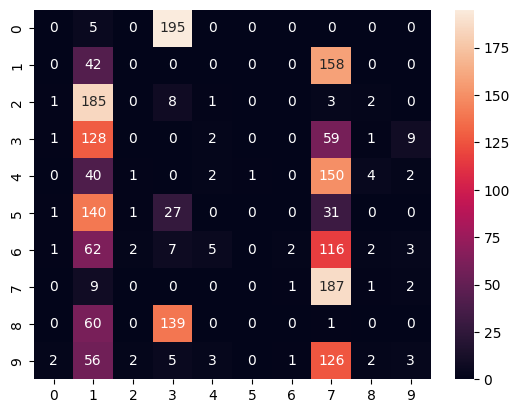

In [153]:
# Confusion matrix for m = 1.3
num_groups = u7_crisp_2.shape[1]
clusters7_2 = np.zeros((num_groups, num_groups))
rows = u7_crisp_2.shape[0] // num_groups
for h in range(num_groups):
    clusters7_2[h] = np.sum(u7_crisp_2[h*rows:(h+1)*rows], axis=0)
clusters7_2 = pd.DataFrame(clusters7_2.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters7_2, annot=True, fmt="d")

In [154]:
clusters7_2

,0,1,2,3,4,5,6,7,8,9
0,0,5,0,195,0,0,0,0,0,0
1,0,42,0,0,0,0,0,158,0,0
2,1,185,0,8,1,0,0,3,2,0
3,1,128,0,0,2,0,0,59,1,9
4,0,40,1,0,2,1,0,150,4,2
5,1,140,1,27,0,0,0,31,0,0
6,1,62,2,7,5,0,2,116,2,3
7,0,9,0,0,0,0,1,187,1,2
8,0,60,0,139,0,0,0,1,0,0
9,2,56,2,5,3,0,1,126,2,3


## <a id='toc3_2_'></a>[m = 1.8](#toc0_)

### <a id='toc3_2_1_'></a>[Dataset 0](#toc0_)

In [156]:
n_clusters = 10
m = 1.8
max_iter = 100
tol = 1e-6
n_runs = 50

model_arrays_8 = []
metrics_8 = []
best_loss = np.inf
best_index_8 = None
for i in range(n_runs):
    print("="*80)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_8 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    kfcm_8.fit(Xs[0], ys[0])
    metrics_8.append(kfcm_8.evaluate())
    model_arrays_8.append({
        "U": kfcm_8._U,
        "G": kfcm_8._G,
        "s": kfcm_8._s,
    })
    if metrics_8[i]["loss"] < best_loss:
        best_loss = metrics_8[i]["loss"]
        best_index_8 = i

-> Run 1/50
Iteration 1: J = 10.867170508088615
(2000,) (2000,)
{'accuracy': 0.4785, 'MPC': 0.00022075181023428758, 'rand': 0.31969896224440736, 'loss': 10.867170508088615}
Iteration 2: J = 11.336636942270312
(2000,) (2000,)
{'accuracy': 0.4215, 'MPC': 0.0001355769022810538, 'rand': 0.25868811271197534, 'loss': 11.336636942270312}
Iteration 3: J = 11.334428789999619
(2000,) (2000,)
{'accuracy': 0.3385, 'MPC': 0.00011944484665404875, 'rand': 0.206427823796738, 'loss': 11.334428789999619}
Iteration 4: J = 11.333965108090151
(2000,) (2000,)
{'accuracy': 0.285, 'MPC': 0.00012109184509390136, 'rand': 0.17410048043746923, 'loss': 11.333965108090151}
Iteration 5: J = 11.333806485096616
(2000,) (2000,)
{'accuracy': 0.264, 'MPC': 0.00013040818292664458, 'rand': 0.16506194777985053, 'loss': 11.333806485096616}
Iteration 6: J = 11.333760024788525
(2000,) (2000,)
{'accuracy': 0.251, 'MPC': 0.00014415831448288952, 'rand': 0.16171184445260167, 'loss': 11.333760024788525}
Iteration 7: J = 11.33376449

In [157]:
best_index_8, metrics_8[best_index_8]

(39,
 {'accuracy': 0.287,
  'MPC': 0.0006175172243514382,
  'rand': 0.17731782102842772,
  'loss': 11.33512675698262})

In [158]:
# Metrics for m = 1.3
acc_vec8 = [metrics_8[i]["accuracy"] for i in range(n_runs)]
rand_vec8 = [metrics_8[i]["rand"] for i in range(n_runs)]
mpc_vec8 = [metrics_8[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec8):.8f}" + u" \u00b1 " + f"{np.std(acc_vec8):.8f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec8):.8f}" + u" \u00b1 " + f"{np.std(rand_vec8):.8f}")
print(f"Mean MPC: {np.mean(mpc_vec8):.8f}" + u" \u00b1 " + f"{np.std(mpc_vec8):.8f}")

Mean Accuracy: 0.36263000 ± 0.02777621
Mean Adjusted Rand Score: 0.25113538 ± 0.03264199
Mean MPC: 0.01614326 ± 0.00966244


In [159]:
# Crisp partition of the best result for m = 1.3
#best_u8 = pd.DataFrame(u3[best_j3])
#RODA DE NOVO
best_u8 = np.array(model_arrays_8[best_index_8]["U"])
u8_crisp = np.zeros_like(best_u8)
for k in range(best_u8.shape[0]):
    max_index = np.argmax(best_u8[k])
    u8_crisp[k][max_index] = 1

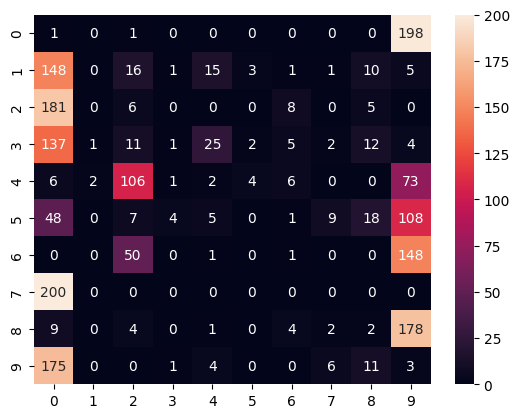

In [160]:
# Confusion matrix for m = 1.3
num_groups = u8_crisp.shape[1]
clusters8 = np.zeros((num_groups, num_groups))
rows = u8_crisp.shape[0] // num_groups
for h in range(num_groups):
    clusters8[h] = np.sum(u8_crisp[h*rows:(h+1)*rows], axis=0)
clusters8 = pd.DataFrame(clusters8.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters8, annot=True, fmt="d")

In [161]:
clusters8

,0,1,2,3,4,5,6,7,8,9
0,1,0,1,0,0,0,0,0,0,198
1,148,0,16,1,15,3,1,1,10,5
2,181,0,6,0,0,0,8,0,5,0
3,137,1,11,1,25,2,5,2,12,4
4,6,2,106,1,2,4,6,0,0,73
5,48,0,7,4,5,0,1,9,18,108
6,0,0,50,0,1,0,1,0,0,148
7,200,0,0,0,0,0,0,0,0,0
8,9,0,4,0,1,0,4,2,2,178
9,175,0,0,1,4,0,0,6,11,3


### <a id='toc3_2_2_'></a>[Dataset 1](#toc0_)

In [162]:
n_clusters = 10
m = 1.8
max_iter = 100
tol = 1e-6
random_state = 42

n_runs = 50

model_arrays_8_1 = []
metrics_8_1 = []
best_loss = np.inf
best_index_8_1 = None
for i in range(n_runs):
    print("="*80)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_8_1 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    # Dataset 1
    kfcm_8_1.fit(Xs[1], ys[1])
    metrics_8_1.append(kfcm_8_1.evaluate())
    model_arrays_8_1.append({
        "U": kfcm_8_1._U,
        "G": kfcm_8_1._G,
        "s": kfcm_8_1._s,
    })
    if metrics_8_1[i]["loss"] < best_loss:
        best_loss = metrics_8_1[i]["loss"]
        best_index_8_1 = i

-> Run 1/50
Iteration 1: J = 9.301725805780839
(2000,) (2000,)
{'accuracy': 0.454, 'MPC': 0.0013480080732379829, 'rand': 0.3226497709743087, 'loss': 9.301725805780839}
Iteration 2: J = 9.378382919930486
(2000,) (2000,)
{'accuracy': 0.4005, 'MPC': 0.0008081833703958985, 'rand': 0.26356516830492815, 'loss': 9.378382919930486}
Iteration 3: J = 9.370699367559162
(2000,) (2000,)
{'accuracy': 0.335, 'MPC': 0.0005121860332334416, 'rand': 0.20284351932760075, 'loss': 9.370699367559162}
Iteration 4: J = 9.366599651050533
(2000,) (2000,)
{'accuracy': 0.2825, 'MPC': 0.00031853887070865117, 'rand': 0.15868163221718076, 'loss': 9.366599651050533}
Iteration 5: J = 9.363895662654544
(2000,) (2000,)
{'accuracy': 0.237, 'MPC': 0.00019252381413359387, 'rand': 0.13800475501383516, 'loss': 9.363895662654544}
Iteration 6: J = 9.362116692361587
(2000,) (2000,)
{'accuracy': 0.22, 'MPC': 0.00011312107822292194, 'rand': 0.1312058179550547, 'loss': 9.362116692361587}
Iteration 7: J = 9.360984107994664
(2000,) (

In [163]:
best_index_8_1, metrics_8_1[best_index_8_1]

(29,
 {'accuracy': 0.1975,
  'MPC': 2.1261001736938567e-08,
  'rand': 0.11570575512501897,
  'loss': 9.35935175908599})

In [164]:
# Metrics for m = 1.3
acc_vec8_1 = [metrics_8_1[i]["accuracy"] for i in range(n_runs)]
rand_vec8_1 = [metrics_8_1[i]["rand"] for i in range(n_runs)]
mpc_vec8_1 = [metrics_8_1[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec8_1):.8f}" + u" \u00b1 " + f"{np.std(acc_vec8_1):.8f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec8_1):.8f}" + u" \u00b1 " + f"{np.std(rand_vec8_1):.8f}")
print(f"Mean MPC: {np.mean(mpc_vec8_1):.8f}" + u" \u00b1 " + f"{np.std(mpc_vec8_1):.8f}")

Mean Accuracy: 0.19768000 ± 0.00026000
Mean Adjusted Rand Score: 0.11566460 ± 0.00007560
Mean MPC: 0.00000003 ± 0.00000001


In [165]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
# RODA DNVB
best_u8_1 = np.array(model_arrays_8_1[best_index_8_1]["U"])
u8_crisp_1 = np.zeros_like(best_u8_1)
for k in range(best_u8_1.shape[0]):
    max_index = np.argmax(best_u8_1[k])
    u8_crisp_1[k][max_index] = 1

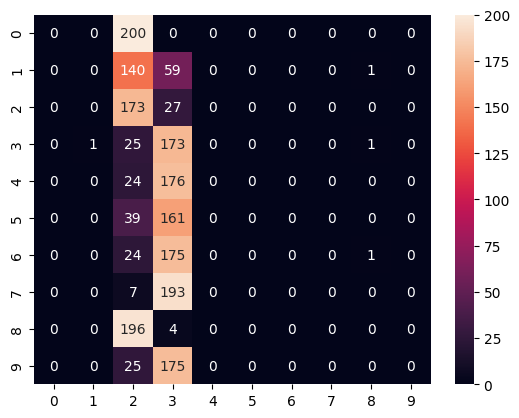

In [166]:
# Confusion matrix for m = 1.3
num_groups = u8_crisp_1.shape[1]
clusters8_1 = np.zeros((num_groups, num_groups))
rows = u8_crisp_1.shape[0] // num_groups
for h in range(num_groups):
    clusters8_1[h] = np.sum(u8_crisp_1[h*rows:(h+1)*rows], axis=0)
clusters8_1 = pd.DataFrame(clusters8_1.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters8_1, annot=True, fmt="d")

In [167]:
clusters8_1

,0,1,2,3,4,5,6,7,8,9
0,0,0,200,0,0,0,0,0,0,0
1,0,0,140,59,0,0,0,0,1,0
2,0,0,173,27,0,0,0,0,0,0
3,0,1,25,173,0,0,0,0,1,0
4,0,0,24,176,0,0,0,0,0,0
5,0,0,39,161,0,0,0,0,0,0
6,0,0,24,175,0,0,0,0,1,0
7,0,0,7,193,0,0,0,0,0,0
8,0,0,196,4,0,0,0,0,0,0
9,0,0,25,175,0,0,0,0,0,0


### <a id='toc3_2_3_'></a>[Dataset 2](#toc0_)

In [168]:
n_clusters = 10
m = 1.8
max_iter = 100
tol = 1e-6

n_runs = 50

model_arrays_8_2 = []
metrics_8_2 = []
best_loss = np.inf
best_index_8_2 = None
for i in range(n_runs):
    print("="*80)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_8_2 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    # Dataset 2
    kfcm_8_2.fit(Xs[2], ys[2])
    metrics_8_2.append(kfcm_8_2.evaluate())
    model_arrays_8_2.append({
        "U": kfcm_8_2._U,
        "G": kfcm_8_2._G,
        "s": kfcm_8_2._s,
    })
    if metrics_8_2[i]["loss"] < best_loss:
        best_loss = metrics_8_2[i]["loss"]
        best_index_8_2 = i

-> Run 1/50
Iteration 1: J = 9.673181511204003
(2000,) (2000,)
{'accuracy': 0.4415, 'MPC': 0.013196433882284753, 'rand': 0.2796289158734263, 'loss': 9.673181511204003}
Iteration 2: J = 9.818404050366988
(2000,) (2000,)
{'accuracy': 0.4245, 'MPC': 0.013431046131217594, 'rand': 0.27600082589043995, 'loss': 9.818404050366988}
Iteration 3: J = 9.804793461439116
(2000,) (2000,)
{'accuracy': 0.396, 'MPC': 0.014646404928296275, 'rand': 0.2589128967034979, 'loss': 9.804793461439116}
Iteration 4: J = 9.797973970694768
(2000,) (2000,)
{'accuracy': 0.375, 'MPC': 0.015979246294152816, 'rand': 0.24487791700360811, 'loss': 9.797973970694768}
Iteration 5: J = 9.793884975001689
(2000,) (2000,)
{'accuracy': 0.368, 'MPC': 0.01718981075582693, 'rand': 0.23636152379455708, 'loss': 9.793884975001689}
Iteration 6: J = 9.79152723652662
(2000,) (2000,)
{'accuracy': 0.3545, 'MPC': 0.018181172078390095, 'rand': 0.2285738042878412, 'loss': 9.79152723652662}
Iteration 7: J = 9.790236421106478
(2000,) (2000,)
{'ac

In [169]:
best_index_8_2, metrics_8_2[best_index_8_2]

(49,
 {'accuracy': 0.2875,
  'MPC': 0.020383558320642092,
  'rand': 0.1605216957484502,
  'loss': 9.785135208741831})

In [170]:
# Metrics for m = 1.3
acc_vec8_2 = [metrics_8_2[i]["accuracy"] for i in range(n_runs)]
rand_vec8_2 = [metrics_8_2[i]["rand"] for i in range(n_runs)]
mpc_vec8_2 = [metrics_8_2[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec8_2):.8f}" + u" \u00b1 " + f"{np.std(acc_vec8_2):.8f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec8_2):.8f}" + u" \u00b1 " + f"{np.std(rand_vec8_2):.8f}")
print(f"Mean MPC: {np.mean(mpc_vec8_2):.8f}" + u" \u00b1 " + f"{np.std(mpc_vec8_2):.8f}")

Mean Accuracy: 0.28852000 ± 0.00054736
Mean Adjusted Rand Score: 0.16122878 ± 0.00026028
Mean MPC: 0.02038358 ± 0.00000001


In [171]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
best_u8_2 = np.array(model_arrays_8_2[best_index_8_2]["U"])
u8_crisp_2 = np.zeros_like(best_u8_2)
for k in range(best_u8_2.shape[0]):
    max_index = np.argmax(best_u8_2[k])
    u8_crisp_2[k][max_index] = 1

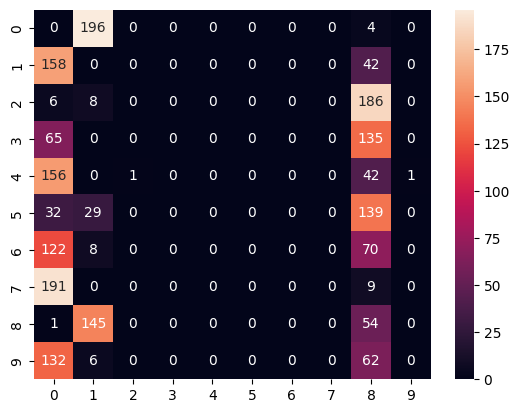

In [172]:
# Confusion matrix for m = 1.3
num_groups = u8_crisp_2.shape[1]
clusters8_2 = np.zeros((num_groups, num_groups))
rows = u8_crisp_2.shape[0] // num_groups
for h in range(num_groups):
    clusters8_2[h] = np.sum(u8_crisp_2[h*rows:(h+1)*rows], axis=0)
clusters8_2 = pd.DataFrame(clusters8_2.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters8_2, annot=True, fmt="d")

In [173]:
clusters8_2

,0,1,2,3,4,5,6,7,8,9
0,0,196,0,0,0,0,0,0,4,0
1,158,0,0,0,0,0,0,0,42,0
2,6,8,0,0,0,0,0,0,186,0
3,65,0,0,0,0,0,0,0,135,0
4,156,0,1,0,0,0,0,0,42,1
5,32,29,0,0,0,0,0,0,139,0
6,122,8,0,0,0,0,0,0,70,0
7,191,0,0,0,0,0,0,0,9,0
8,1,145,0,0,0,0,0,0,54,0
9,132,6,0,0,0,0,0,0,62,0


## <a id='toc3_2_'></a>[m = 1.9](#toc0_)

### <a id='toc3_2_1_'></a>[Dataset 0](#toc0_)

In [174]:
n_clusters = 10
m = 1.9
max_iter = 100
tol = 1e-6
n_runs = 50

model_arrays_9 = []
metrics_9 = []
best_loss = np.inf
best_index_9 = None
for i in range(n_runs):
    print("="*90)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_9 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    kfcm_9.fit(Xs[0], ys[0])
    metrics_9.append(kfcm_9.evaluate())
    model_arrays_9.append({
        "U": kfcm_9._U,
        "G": kfcm_9._G,
        "s": kfcm_9._s,
    })
    if metrics_9[i]["loss"] < best_loss:
        best_loss = metrics_9[i]["loss"]
        best_index_9 = i

-> Run 1/50
Iteration 1: J = 8.99407552560564
(2000,) (2000,)
{'accuracy': 0.5475, 'MPC': 0.000617183699666457, 'rand': 0.3463481686696377, 'loss': 8.99407552560564}
Iteration 2: J = 9.008539967908836
(2000,) (2000,)
{'accuracy': 0.4435, 'MPC': 0.0004869776110094648, 'rand': 0.2718161407903888, 'loss': 9.008539967908836}
Iteration 3: J = 9.006190745252185
(2000,) (2000,)
{'accuracy': 0.3835, 'MPC': 0.0004375693490861199, 'rand': 0.24351475603289274, 'loss': 9.006190745252185}
Iteration 4: J = 9.005518259721015
(2000,) (2000,)
{'accuracy': 0.346, 'MPC': 0.0004122003446745959, 'rand': 0.228411711572798, 'loss': 9.005518259721015}
Iteration 5: J = 9.005219049595794
(2000,) (2000,)
{'accuracy': 0.334, 'MPC': 0.0003966138203581604, 'rand': 0.21929455179028856, 'loss': 9.005219049595794}
Iteration 6: J = 9.005067743609395
(2000,) (2000,)
{'accuracy': 0.321, 'MPC': 0.0003854830508701612, 'rand': 0.20915650997091154, 'loss': 9.005067743609395}
Iteration 7: J = 9.004978982579821
(2000,) (2000,)

In [175]:
best_index_9, metrics_9[best_index_9]

(7,
 {'accuracy': 0.22,
  'MPC': 3.548852118584467e-05,
  'rand': 0.1549456289862699,
  'loss': 9.002644832520843})

In [176]:
# Metrics for m = 1.3
acc_vec9 = [metrics_9[i]["accuracy"] for i in range(n_runs)]
rand_vec9 = [metrics_9[i]["rand"] for i in range(n_runs)]
mpc_vec9 = [metrics_9[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec9):.9f}" + u" \u00b1 " + f"{np.std(acc_vec9):.9f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec9):.9f}" + u" \u00b1 " + f"{np.std(rand_vec9):.9f}")
print(f"Mean MPC: {np.mean(mpc_vec9):.9f}" + u" \u00b1 " + f"{np.std(mpc_vec9):.9f}")

Mean Accuracy: 0.215250000 ± 0.002550000
Mean Adjusted Rand Score: 0.155225349 ± 0.001387390
Mean MPC: 0.000129071 ± 0.000033265


In [177]:
# Crisp partition of the best result for m = 1.3
#best_u9 = pd.DataFrame(u3[best_j3])
#RODA DE NOVO
best_u9 = np.array(model_arrays_9[best_index_9]["U"])
u9_crisp = np.zeros_like(best_u9)
for k in range(best_u9.shape[0]):
    max_index = np.argmax(best_u9[k])
    u9_crisp[k][max_index] = 1

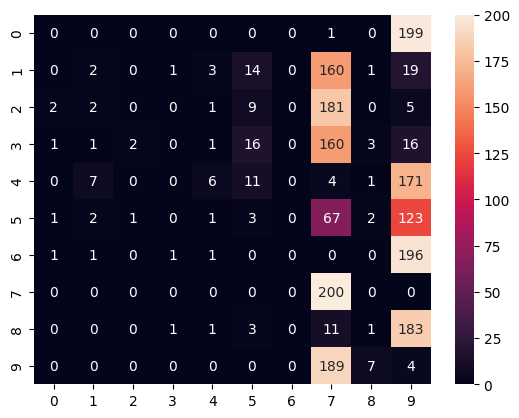

In [178]:
# Confusion matrix for m = 1.3
num_groups = u9_crisp.shape[1]
clusters9 = np.zeros((num_groups, num_groups))
rows = u9_crisp.shape[0] // num_groups
for h in range(num_groups):
    clusters9[h] = np.sum(u9_crisp[h*rows:(h+1)*rows], axis=0)
clusters9 = pd.DataFrame(clusters9.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters9, annot=True, fmt="d")

In [179]:
clusters9

,0,1,2,3,4,5,6,7,8,9
0,0,0,0,0,0,0,0,1,0,199
1,0,2,0,1,3,14,0,160,1,19
2,2,2,0,0,1,9,0,181,0,5
3,1,1,2,0,1,16,0,160,3,16
4,0,7,0,0,6,11,0,4,1,171
5,1,2,1,0,1,3,0,67,2,123
6,1,1,0,1,1,0,0,0,0,196
7,0,0,0,0,0,0,0,200,0,0
8,0,0,0,1,1,3,0,11,1,183
9,0,0,0,0,0,0,0,189,7,4


### <a id='toc3_2_2_'></a>[Dataset 1](#toc0_)

In [180]:
n_clusters = 10
m = 1.9
max_iter = 100
tol = 1e-6
random_state = 42

n_runs = 50

model_arrays_9_1 = []
metrics_9_1 = []
best_loss = np.inf
best_index_9_1 = None
for i in range(n_runs):
    print("="*90)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_9_1 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    # Dataset 1
    kfcm_9_1.fit(Xs[1], ys[1])
    metrics_9_1.append(kfcm_9_1.evaluate())
    model_arrays_9_1.append({
        "U": kfcm_9_1._U,
        "G": kfcm_9_1._G,
        "s": kfcm_9_1._s,
    })
    if metrics_9_1[i]["loss"] < best_loss:
        best_loss = metrics_9_1[i]["loss"]
        best_index_9_1 = i

-> Run 1/50
Iteration 1: J = 7.392161903094987
(2000,) (2000,)
{'accuracy': 0.4555, 'MPC': 0.0009827280999893384, 'rand': 0.32368227791235094, 'loss': 7.392161903094987}
Iteration 2: J = 7.448629900640762
(2000,) (2000,)
{'accuracy': 0.405, 'MPC': 0.0004942829257209569, 'rand': 0.2693142308504191, 'loss': 7.448629900640762}
Iteration 3: J = 7.441458793153636
(2000,) (2000,)
{'accuracy': 0.334, 'MPC': 0.00026380602149800314, 'rand': 0.19864246107582711, 'loss': 7.441458793153636}
Iteration 4: J = 7.438175374715232
(2000,) (2000,)
{'accuracy': 0.2695, 'MPC': 0.00013761495110442556, 'rand': 0.15025790022622393, 'loss': 7.438175374715232}
Iteration 5: J = 7.436367754297059
(2000,) (2000,)
{'accuracy': 0.227, 'MPC': 6.973153085088057e-05, 'rand': 0.13324829174885633, 'loss': 7.436367754297059}
Iteration 6: J = 7.435394308896094
(2000,) (2000,)
{'accuracy': 0.213, 'MPC': 3.446079745816899e-05, 'rand': 0.12779822169870197, 'loss': 7.435394308896094}
Iteration 7: J = 7.434888972265281
(2000,) 

In [181]:
best_index_9_1, metrics_9_1[best_index_9_1]

(39,
 {'accuracy': 0.1975,
  'MPC': 1.3081143501736392e-08,
  'rand': 0.11551008684998869,
  'loss': 7.434397294258661})

In [182]:
# Metrics for m = 1.3
acc_vec9_1 = [metrics_9_1[i]["accuracy"] for i in range(n_runs)]
rand_vec9_1 = [metrics_9_1[i]["rand"] for i in range(n_runs)]
mpc_vec9_1 = [metrics_9_1[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec9_1):.9f}" + u" \u00b1 " + f"{np.std(acc_vec9_1):.9f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec9_1):.9f}" + u" \u00b1 " + f"{np.std(rand_vec9_1):.9f}")
print(f"Mean MPC: {np.mean(mpc_vec9_1):.9f}" + u" \u00b1 " + f"{np.std(mpc_vec9_1):.9f}")

Mean Accuracy: 0.197710000 ± 0.000301496
Mean Adjusted Rand Score: 0.115652442 ± 0.000094309
Mean MPC: 0.000000020 ± 0.000000005


In [183]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
# RODA DNVB
best_u9_1 = np.array(model_arrays_9_1[best_index_9_1]["U"])
u9_crisp_1 = np.zeros_like(best_u9_1)
for k in range(best_u9_1.shape[0]):
    max_index = np.argmax(best_u9_1[k])
    u9_crisp_1[k][max_index] = 1

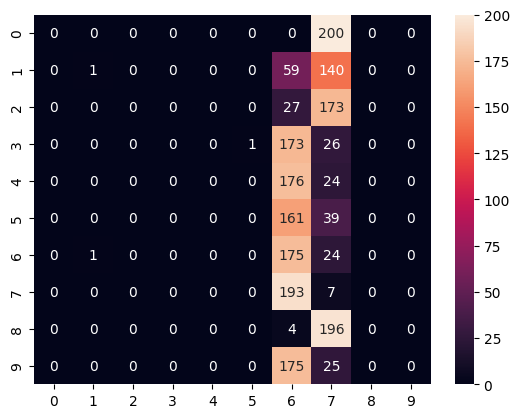

In [184]:
# Confusion matrix for m = 1.3
num_groups = u9_crisp_1.shape[1]
clusters9_1 = np.zeros((num_groups, num_groups))
rows = u9_crisp_1.shape[0] // num_groups
for h in range(num_groups):
    clusters9_1[h] = np.sum(u9_crisp_1[h*rows:(h+1)*rows], axis=0)
clusters9_1 = pd.DataFrame(clusters9_1.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters9_1, annot=True, fmt="d")

In [185]:
clusters9_1

,0,1,2,3,4,5,6,7,8,9
0,0,0,0,0,0,0,0,200,0,0
1,0,1,0,0,0,0,59,140,0,0
2,0,0,0,0,0,0,27,173,0,0
3,0,0,0,0,0,1,173,26,0,0
4,0,0,0,0,0,0,176,24,0,0
5,0,0,0,0,0,0,161,39,0,0
6,0,1,0,0,0,0,175,24,0,0
7,0,0,0,0,0,0,193,7,0,0
8,0,0,0,0,0,0,4,196,0,0
9,0,0,0,0,0,0,175,25,0,0


### <a id='toc3_2_3_'></a>[Dataset 2](#toc0_)

In [186]:
n_clusters = 10
m = 1.9
max_iter = 100
tol = 1e-6

n_runs = 50

model_arrays_9_2 = []
metrics_9_2 = []
best_loss = np.inf
best_index_9_2 = None
for i in range(n_runs):
    print("="*90)
    print(f"-> Run {i+1}/{n_runs}")
    kfcm_9_2 = KFCM_K_W1(n_clusters=n_clusters, m=m, n_iter=max_iter, epsilon=tol, verbose=True, random_state=i)
    # Dataset 2
    kfcm_9_2.fit(Xs[2], ys[2])
    metrics_9_2.append(kfcm_9_2.evaluate())
    model_arrays_9_2.append({
        "U": kfcm_9_2._U,
        "G": kfcm_9_2._G,
        "s": kfcm_9_2._s,
    })
    if metrics_9_2[i]["loss"] < best_loss:
        best_loss = metrics_9_2[i]["loss"]
        best_index_9_2 = i

-> Run 1/50
Iteration 1: J = 7.7083431047622515
(2000,) (2000,)
{'accuracy': 0.436, 'MPC': 0.00920822888460826, 'rand': 0.2763252530108112, 'loss': 7.7083431047622515}
Iteration 2: J = 7.82337984061218
(2000,) (2000,)
{'accuracy': 0.417, 'MPC': 0.008315443585878657, 'rand': 0.27210366279352116, 'loss': 7.82337984061218}
Iteration 3: J = 7.81324001856783
(2000,) (2000,)
{'accuracy': 0.3855, 'MPC': 0.008367229330358605, 'rand': 0.2535529871037596, 'loss': 7.81324001856783}
Iteration 4: J = 7.808432777514775
(2000,) (2000,)
{'accuracy': 0.362, 'MPC': 0.008692183303563472, 'rand': 0.239107465074032, 'loss': 7.808432777514775}
Iteration 5: J = 7.805457391351059
(2000,) (2000,)
{'accuracy': 0.349, 'MPC': 0.009140804125773228, 'rand': 0.23277798932191926, 'loss': 7.805457391351059}
Iteration 6: J = 7.803484302146062
(2000,) (2000,)
{'accuracy': 0.338, 'MPC': 0.009646187180203158, 'rand': 0.22934323516950494, 'loss': 7.803484302146062}
Iteration 7: J = 7.80219999324849
(2000,) (2000,)
{'accura

In [187]:
best_index_9_2, metrics_9_2[best_index_9_2]

(34,
 {'accuracy': 0.204,
  'MPC': 2.5632341819070703e-06,
  'rand': 0.10094702151303875,
  'loss': 7.790788868831219})

In [188]:
# Metrics for m = 1.3
acc_vec9_2 = [metrics_9_2[i]["accuracy"] for i in range(n_runs)]
rand_vec9_2 = [metrics_9_2[i]["rand"] for i in range(n_runs)]
mpc_vec9_2 = [metrics_9_2[i]["MPC"] for i in range(n_runs)]

print(f"Mean Accuracy: {np.mean(acc_vec9_2):.9f}" + u" \u00b1 " + f"{np.std(acc_vec9_2):.9f}")
print(f"Mean Adjusted Rand Score: {np.mean(rand_vec9_2):.9f}" + u" \u00b1 " + f"{np.std(rand_vec9_2):.9f}")
print(f"Mean MPC: {np.mean(mpc_vec9_2):.9f}" + u" \u00b1 " + f"{np.std(mpc_vec9_2):.9f}")

Mean Accuracy: 0.280560000 ± 0.016775172
Mean Adjusted Rand Score: 0.158922089 ± 0.012502308
Mean MPC: 0.012616536 ± 0.003147039


In [189]:
# Crisp partition of the best result for m = 1.3
#best_u3 = pd.DataFrame(u3[best_j3])
best_u9_2 = np.array(model_arrays_9_2[best_index_9_2]["U"])
u9_crisp_2 = np.zeros_like(best_u9_2)
for k in range(best_u9_2.shape[0]):
    max_index = np.argmax(best_u9_2[k])
    u9_crisp_2[k][max_index] = 1

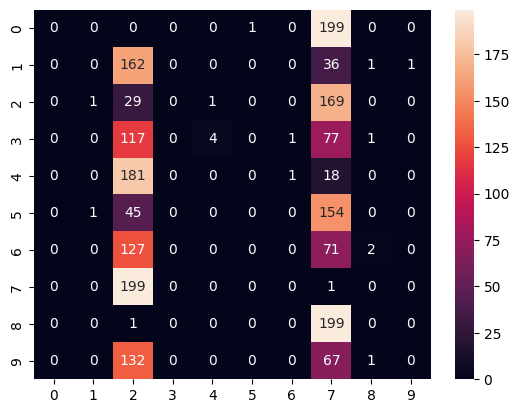

In [190]:
# Confusion matrix for m = 1.3
num_groups = u9_crisp_2.shape[1]
clusters9_2 = np.zeros((num_groups, num_groups))
rows = u9_crisp_2.shape[0] // num_groups
for h in range(num_groups):
    clusters9_2[h] = np.sum(u9_crisp_2[h*rows:(h+1)*rows], axis=0)
clusters9_2 = pd.DataFrame(clusters9_2.astype(int))

with sns.plotting_context():
    sns.heatmap(clusters9_2, annot=True, fmt="d")

In [191]:
clusters9_2

,0,1,2,3,4,5,6,7,8,9
0,0,0,0,0,0,1,0,199,0,0
1,0,0,162,0,0,0,0,36,1,1
2,0,1,29,0,1,0,0,169,0,0
3,0,0,117,0,4,0,1,77,1,0
4,0,0,181,0,0,0,1,18,0,0
5,0,1,45,0,0,0,0,154,0,0
6,0,0,127,0,0,0,0,71,2,0
7,0,0,199,0,0,0,0,1,0,0
8,0,0,1,0,0,0,0,199,0,0
9,0,0,132,0,0,0,0,67,1,0
